The Random Forest model gave the best result on each of the four evaluation criteria used to evaluate the models. The Random Forest model is mortgage applications per day perform best, then Decision Tree model. The SVR model scored is the worse, SVM on a second place. The percent error of the Random Forest model is around of the actual amount of mortgage applications per day.
Linear Regression, 
Logistic Regression
Random Forests (RF) 
Support Vector Regression (SVR)
Support Vector Machine (SVM)
k-Nearest Neighbors
Decision Tree Classifier 


In [1]:
import datetime
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import os                             # Library to do things on the filesystem
import pandas as pd                   # Super cool general purpose data handling library
import matplotlib.pyplot as plt       # Standard plotting library
import seaborn as sns
import numpy as np                    # General purpose math library
from IPython.display import display   # A notebook function to display more complex data (like tables)
import scipy.stats as stats  

import numpy as np
from scipy.stats import kurtosis
from scipy.stats import skew


data = pd.read_csv('/scripts/mwb2014.csv', header=0, encoding='cp1252')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2501 entries, 0 to 2500
Data columns (total 24 columns):
First Name                2501 non-null object
Last Name                 2501 non-null object
City                      2501 non-null object
State                     2501 non-null object
Zip                       2501 non-null int64
Loan Amount               2501 non-null float64
Estimated Value           2501 non-null int64
Loan Purpose              2501 non-null object
Qualification FICO        2501 non-null int64
Is Primary Wage Earner    2501 non-null bool
Income Type               2501 non-null object
Asset Docs                2501 non-null object
Occupancy                 1846 non-null object
Unit Type                 2501 non-null object
Loan Type                 2501 non-null object
Lender Name               2501 non-null object
Created Date              2501 non-null object
Time                      2501 non-null object
Fix                       2501 non-null bool
ARM   

In [2]:
data.shape

(2501, 24)

In [3]:
# Print the 5th and 95th percentiles
print(data.quantile([0.05, 0.95]))
print(data['Loan Amount'].quantile([0.05, 0.95]))
print(data['Loan Amount'].quantile([0.1, 0.90]))

print(data['Loan Amount'].quantile([0.1, 0.90]))

St=['CT', 'FL', 'NJ', 'NY', 'PA']
print(St)

#DataFrame subsets by State
ct_data = data[data['State'].isin(['CT'])]
fl_data = data[data['State'].isin(['FL'])]
ny_data = data[data['State'].isin(['NY'])]
nj_data = data[data['State'].isin(['NJ'])]
pa_data = data[data['State'].isin(['PA'])]


#Selecting data per column
ct_lo_amount = ct_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'unit_type_code', 'Loan Type')]
fl_lo_amount = fl_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
nj_lo_amount = nj_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
ny_lo_amount = ny_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
pa_lo_amount = pa_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]



          Zip  Loan Amount  Estimated Value  Qualification FICO  \
0.05   7083.0     150000.0         205275.0               636.0   
0.95  11756.0     840000.0        1400000.0               803.0   

      Is Primary Wage Earner  Fix  ARM  CLTV  LoanInMonth  
0.05                     0.0  0.0  0.0   0.0          3.0  
0.95                     1.0  1.0  1.0  96.0         56.0  
0.05    150000.0
0.95    840000.0
Name: Loan Amount, dtype: float64
0.1    200000.0
0.9    696500.0
Name: Loan Amount, dtype: float64
0.1    200000.0
0.9    696500.0
Name: Loan Amount, dtype: float64
['CT', 'FL', 'NJ', 'NY', 'PA']


C:\Users\achow\Anaconda3\lib\site-packages\pandas\core\indexing.py:870: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_lowerdim(tup)


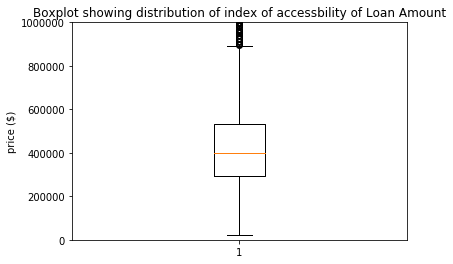

In [4]:
#creating boxplot to see the distribution median and outliers
plt.boxplot(data['Loan Amount'])
plt.title("Boxplot showing distribution of index of accessbility of Loan Amount")
plt.ylim(0.1,1000000)
plt.ylabel('price ($)')
plt.show()

# Mortgage interest rates
Mortgage interest rates have a significant impact on the amount of mortgage applications. If the interest rates are low, the mortgages are relatively cheaper for the borrower as they have to pay less interest, which leads to an increased amount of mortgage applications. A high mortgage interest rate means the mortgage borrower pays a high amount of interest to the lender, which makes the mortgage less attractive for the borrower. Interest rate changes have a significant impact on mortgage applications, as was seen in November of last year, where a sudden increase in interest rates led to a large peak in mortgage applications.  The main difference between the mortgages offered by these types of companies lies in the mortgage interest rates. Even a small difference in mortgage interest rates can often save or cost the borrower a vast amount of money, due to the large sum of a mortgage.  

In general, there are two types of mortgage interest rate: variable rates (ARM) and fixed rates. Variable interest rates are generally lower than fixed interest rates, but can change every month. Fixed interest rates are slightly higher, but are fixed for a certain period of time. A fixed interest rate is generally preferred when the mortgage interest rates are expected to rise, or when the borrower wants to know its monthly expenses upfront. A variable interest rate (ARM) is preferred when interest rates are expected to decrease. If a financial institution has a significantly higher interest rate than its competitors, it will generally receive fewer mortgage applications as the independent mortgage advisors will forward its customers to a different mortgage lender.

Financial institutions sometimes increase their interest rates during the summer months, and at
the end of the year, as there is less personnel available to handle the requests due to vacations and
holidays. With less personnel available they can handle less mortgage requests, so in order to keep the
processing time the same they choose to reduce the input, by increasing the interest rates. Financial
institutions may also specifically keep interest rates low for mortgages with a certain fixed interest
period. Interest rate changes are not always directly influenced by changes in the cost of lending, but can have numerous reasons.



Load US 10-Years Treasury Data

In [5]:
US10Y = pd.read_csv('/scripts/US10Y.csv', header=0, index_col='DATE', encoding='cp1252')
US10Y.head()

,RATE
DATE,
10/14/2014,2.21
10/15/2014,2.15
10/16/2014,2.17
10/17/2014,2.22
10/20/2014,2.2


In [6]:
US10Y.replace('.', -99999, inplace=True)

US10Y= US10Y.replace(to_replace=[-99999], value=[np.nan])

US10Y= US10Y.fillna(method='ffill')
US10Y= US10Y[['RATE']].astype('float64')
US10Y.info()
US10Y.describe()
US10Y.info()
type(US10Y)

<class 'pandas.core.frame.DataFrame'>
Index: 1098 entries, 10/14/2014 to 12/27/2018
Data columns (total 1 columns):
RATE    1098 non-null float64
dtypes: float64(1)
memory usage: 17.2+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 1098 entries, 10/14/2014 to 12/27/2018
Data columns (total 1 columns):
RATE    1098 non-null float64
dtypes: float64(1)
memory usage: 17.2+ KB


pandas.core.frame.DataFrame

In [7]:
total_missing_rate=US10Y.isnull().sum() #Checking for missing values

In [8]:
print(total_missing_rate)

RATE    0
dtype: int64


C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  


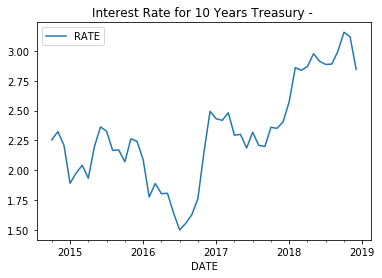

In [9]:
US10Y.index = pd.to_datetime(US10Y.index)
monthly_rate_data=US10Y.resample('M',how='mean').plot(title="Interest Rate for 10 Years Treasury - ")

# Displaying Monthly US Treasury 10 Years interestRate

Generally, when US 10 Years Treasury Rate fluctuates, that leads lenders to adjust their internal bank rates accordingly. 
Also interest rates for consumers varies on several risk factors, such as DTI (Debt to Income Ratio), FICO Scores, Recent 
derogatory events on their credit history, stable job history, W2 or 1099, Stated Income, Profit or Loss Statements, Student 
Loans, Auto Payments, Credit utilization, Property types, number of households, rental history, etc.

Interest Rate is currently historical low. In the short run rate may go ups and down but in the long run rate will go up. As housing price goes up, interest rate will go up to control the housing price.

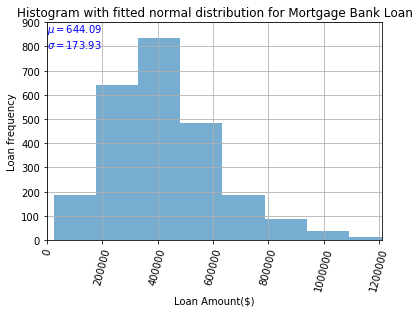

excess kurtosis of normal distribution (should be 0): 10.20423896299732
skewness of normal distribution (should be 0): 1.6231675369974472
mean :  644.086535155362
var  :  30252.443004451427
skew :  1.6231675369974472
kurt :  10.20423896299732


In [10]:
import os                             # Library to do things on the filesystem
import pandas as pd                   # Super cool general purpose data handling library
import matplotlib.pyplot as plt       # Standard plotting library
import seaborn as sns
import numpy as np                    # General purpose math library
from IPython.display import display   # A notebook function to display more complex data (like tables)
import scipy.stats as stats  

import numpy as np
from scipy.stats import kurtosis
from scipy.stats import skew

loan_patterns = data[['Loan Amount', 'Created Date']]
loan_patterns.head()

'''
We can create a histogram with 20 bins to show the distribution of purchasing patterns.'''

loan_patterns_plot = loan_patterns['Loan Amount'].hist(alpha=0.6, bins=40, grid=True)

loan_patterns_plot = loan_patterns['Loan Amount'].apply(np.sqrt)

param = stats.norm.fit(loan_patterns_plot) 
x = np.linspace(0, 100000, 1250000)      # Linear spacing of 100 elements between 0 and 20.
pdf_fitted = stats.norm.pdf(x, *param)    # Use the fitted paramters to 
loan_patterns_plot.plot.hist(alpha=0.6, bins=40, grid=True, density=True, legend=None)
# Fit a normal distribution to the data
# Plot the histogram again
# Plot some fancy text to show us what the paramters of the distribution are (mean and standard deviation)
plt.text(x=np.min(loan_patterns_plot), y=800, s=r"$\mu=%0.2f$" % param[0] + "\n" + r"$\sigma=%0.2f$" % param[1], color='b')

# Plot a line of the fitted distribution over the top
# Standard plot stuff
plt.xticks(rotation=75)
plt.ylim((1,900))
plt.xlim((1,1210000))
plt.xlabel("Loan Amount($)")
plt.ylabel("Loan frequency")
plt.title("Histogram with fitted normal distribution for Mortgage Bank Loan")

# Density Plot with Rug Plot

plt.show()

print( 'excess kurtosis of normal distribution (should be 0): {}'.format( kurtosis(loan_patterns_plot) ))
print( 'skewness of normal distribution (should be 0): {}'.format( skew(loan_patterns_plot) ))

print("mean : ", np.mean(loan_patterns_plot))
print("var  : ", np.var(loan_patterns_plot))
print("skew : ",skew(loan_patterns_plot))
print("kurt : ",kurtosis(loan_patterns_plot))

The fancy text to show us what the parameters of the distribution are (mean and standard deviation). We can create a histogram with 20 bins to show the distribution of purchasing patterns. Fit a normal distribution to the data then plot the histogram. 

Now we will compare Monthly Revenue, Monthly Closed Loan Number and Active Mortgage Loan Originators. We will count number of MLO actively closing loans on any given month.

In [11]:


loan_patterns = data[['Loan Amount', 'Created Date']]
loan_patterns.head()



,Loan Amount,Created Date
0,506250.0,10/14/2014
1,206250.0,10/14/2014
2,648700.0,10/14/2014
3,412750.0,10/14/2014
4,522588.0,10/14/2014


C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).last()
  # Remove the CWD from sys.path while we load stuff.
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is 

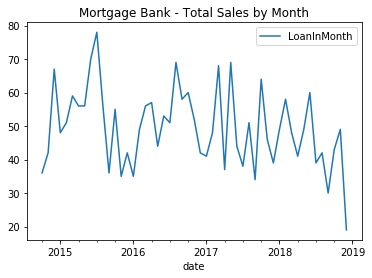

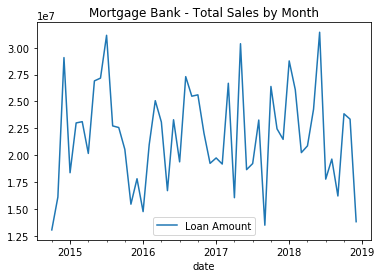

In [12]:
mlo_num=data[['Loan Officer Name']]
mlo_num['date'] = pd.DatetimeIndex(data['Created Date'])
mlo_num = mlo_num.set_index('date')
monthly_mlo_num=mlo_num.resample('M').nunique()

monthly_loan_num=data[['LoanInMonth']]
monthly_loan_num.head()
monthly_loan_num['date'] = pd.DatetimeIndex(data['Created Date'])
monthly_loan_num = monthly_loan_num.set_index('date')
monthly_loan_num_data=monthly_loan_num.resample('M', how='last').plot(title="Mortgage Bank - Total Sales by Month",legend=True)

loan_rev_data=data[['Loan Amount']]
loan_rev_data['date'] = pd.DatetimeIndex(data['Created Date'])
loan_rev_data = loan_rev_data.set_index('date')
monthly_loan_rev_data=loan_rev_data.resample('M', how=sum).plot(title="Mortgage Bank - Total Sales by Month",legend=True)

type(monthly_loan_rev_data)
monthly_loan_rev_data= loan_rev_data.resample('M',how=sum)

C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).last()
  """Entry point for launching an IPython kernel.
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).last()
  


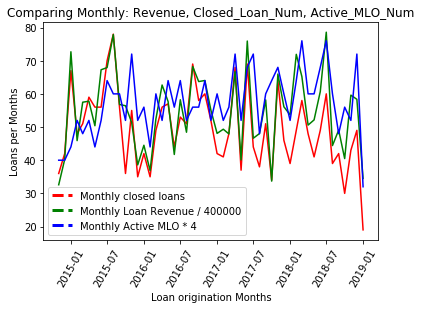

In [13]:
monthly_loan_num.resample('M', how='last')
monthly_loan_num_data= monthly_loan_num.resample('M', how='last')
#monthly_loan_num_plot = monthly_loan_num.resample('M',how='count').plot(title="Mortgage Bank - Total Sales by Month",legend=True)
plt.xlabel('Loan origination Months')
plt.xticks(rotation=60)
plt.ylabel('Loans per Months')
plt.title('Mortgage Bank Monthly Loan numbers')


from matplotlib.lines import Line2D
colors = ['red', 'green', 'blue']
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='--') for c in colors]
labels = ['Monthly closed loans', 'Monthly Loan Revenue / 400000', 'Monthly Active MLO * 4']
plt.plot(monthly_loan_num_data, color='red')
plt.plot(monthly_loan_rev_data/400000, color='green')
plt.plot(monthly_mlo_num*4, color='blue')
plt.legend(lines, labels)
plt.title('Comparing Monthly: Revenue, Closed_Loan_Num, Active_MLO_Num')
plt.show()


As we know that number of producer is essential component in any given business. MLO (Mortgage loan Originator) is core component in Mortgage business. Many MLO works indedendently and interect directly to clients, involve in marketting and grow their business. There could be many MLO in Mortgage Bank, but active MLO generate more reverue for the bank. As number of active MLO goes up, which will directly and positively impact numbers of loan closed per month, eventually mortgage revenue will go up. On the other hand, once number of active MLO goes down, mortgage revenue and number of loan per month goes down as well. By visualizing the graphs, we can see that monthly data of closed loan numbers , monthly revenue and active MLO numbers ber months, all moving at the same direction.

Let’s find out interest rate effect on Monthly Closed Loans and Monthly Revenue.


C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  


AxesSubplot(0.125,0.125;0.775x0.755)


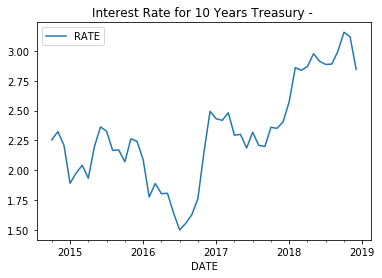

In [14]:
US10Y.index = pd.to_datetime(US10Y.index)
monthly_rate_data=US10Y.resample('M',how='mean').plot(title="Interest Rate for 10 Years Treasury - ")
print(monthly_rate_data)


C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).mean()
  """Entry point for launching an IPython kernel.


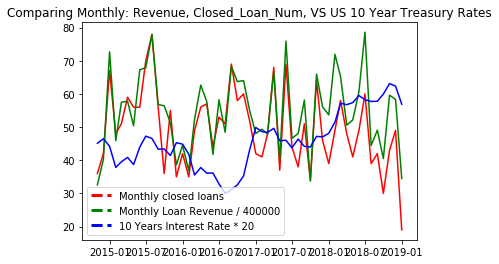

In [15]:
monthly_rate_data=US10Y.resample('M',how='mean')
from matplotlib.lines import Line2D

colors = ['red', 'green', 'blue']
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='--') for c in colors]
labels = ['Monthly closed loans', 'Monthly Loan Revenue / 400000', '10 Years Interest Rate * 20']

plt.plot(monthly_loan_num_data, color='red')
plt.plot(monthly_loan_rev_data/400000, color='green')
plt.plot(monthly_rate_data*20, color='blue')
plt.legend(lines, labels)
plt.title('Comparing Monthly: Revenue, Closed_Loan_Num, VS US 10 Year Treasury Rates')
plt.show()



We can see the strong positive correlation between Monthly Closed Loans and Monthly Revenue. This graph also suggest that, as interest rates goes down, banks monthly revenue and numbers of loans increases, and when the Rates goes up, both Monthly Closed Loans and Monthly Revenue for the Mortgage bank decline. Pearson correlation coefficient between Monthly Interest & Monthly loans Closed Data is  -0.334, which clearly proves that Monthly Interest Rates & Monthly loans Closed Data is negatively correlated.

In [16]:
def pearson_r(x, y):
    """Compute Pearson correlation coefficient between two arrays."""
    # Compute correlation matrix: corr_mat
    corr_mat = scipy.stats.pearsonr()

    # Return entry [0,1]
    return corr_mat[0, 1]

In [17]:
#scipy.stats.pearsonr(x, y)
%matplotlib inline 

import numpy as np
import pandas as pd
import scipy
import scipy.stats as stats
import matplotlib.pyplot as plt
import sklearn

fico = data['Qualification FICO']
loan_amount=data['Loan Amount']
cltv_data = data['CLTV']
scipy.stats.pearsonr(cltv_data, fico)
r_loan_amount_fico = scipy.stats.pearsonr(loan_amount, fico)
r_cltv_data_fico = scipy.stats.pearsonr(cltv_data, fico)
r_loan_amount_cltv_data = scipy.stats.pearsonr(loan_amount, cltv_data)
r_monthly_loan_num_data_monthly_loan_rev = scipy.stats.pearsonr(monthly_loan_num_data, monthly_loan_rev_data)

# Print the result
print('Pearson correlation coefficient between FICO and Loan_Amount: ', r_loan_amount_fico)

print('Pearson correlation coefficient between FICO and CLTV: ', r_cltv_data_fico)

print('Pearson correlation coefficient between Loan Amount and CLTV: ', r_loan_amount_cltv_data)

print('Pearson correlation coefficient between Loan number and Loan Revenue: ', r_monthly_loan_num_data_monthly_loan_rev)


Pearson correlation coefficient between FICO and Loan_Amount:  (0.007679913675807394, 0.7010628450657441)
Pearson correlation coefficient between FICO and CLTV:  (-0.03706042959216819, 0.06386772845856088)
Pearson correlation coefficient between Loan Amount and CLTV:  (-0.006696250380445668, 0.7378394696435531)
Pearson correlation coefficient between Loan number and Loan Revenue:  (array([0.84472037]), array([6.63988048e-15]))


Acquire 1000 pairs bootstrap replicates of the Pearson correlation coefficient using the draw_bs_pairs() function you wrote in the previous exercise for CLTV data VS Qualification FICO Data and Monthly Loan_num_data VS. Monthly_loan_rev.
Compute the 95% confidence interval for both using your bootstrap replicates.
-We have created a NumPy array of percentiles to compute. These are the 2.5th,
and 97.5th. By creating a list and convert the list to a NumPy array using np.array(). For example, np.array([2.5, 97.5]) would create an array consisting of the 2.5th and 97.5th percentiles.

In [18]:

pearson_r0=scipy.stats.pearsonr(cltv_data, fico)
pearson_r1=scipy.stats.pearsonr(loan_amount, fico)


# Print results
print('CLTV data VS Qualification FICO Data       :', pearson_r0)
print('Monthly Loan_Amount VS. FICO Data          :', pearson_r1)


CLTV data VS Qualification FICO Data       : (-0.03706042959216819, 0.06386772845856088)
Monthly Loan_Amount VS. FICO Data          : (0.007679913675807394, 0.7010628450657441)


# Random Walk

Are Interest Rates or Monthly Loan Returns Prices a Random Walk?

Most returns prices follow a random walk (perhaps with a drift). We will look at a time series of Monthly Sales Revenue, and run the 'Augmented Dickey-Fuller Test' from the statsmodels library to show that it does indeed follow a random walk. With the ADF test, the "null hypothesis" (the hypothesis that we either reject or fail to reject) is that the series follows a random walk. Therefore, a low p-value (say less than 5%) means we can reject the null hypothesis that the series is a random walk.
Print out just the p-value of the test (adfuller_loan_rev_data[0] is the test statistic, and adfuller_loan_rev_data[1] is the p-value). Print out the entire output, which includes the test statistic, the p-values, and the critical values for tests with 1%, 10%, and 5% levels.


In [19]:
# Import the adfuller module from statsmodels
from statsmodels.tsa.stattools import adfuller

loan_rev_data=data[['Loan Amount']]
loan_rev_data['date'] = pd.DatetimeIndex(data['Created Date'])
loan_rev_data = loan_rev_data.set_index('date')
#monthly_loan_rev_data=loan_rev_data.resample('M', how=sum).plot(title="Mortgage Bank - Total Sales by Month",legend=True)


monthly_loan_rev_data= loan_rev_data.resample('M').sum()
print(monthly_loan_rev_data)
# Run the ADF test on the monthly_loan_rev_data series and print out the results
adfuller_loan_rev_data = adfuller(monthly_loan_rev_data['Loan Amount'], autolag='AIC')

print(adfuller_loan_rev_data)
# Just print out the p-value
print('The p-value of the test on loan_rev is: ' + str(adfuller_loan_rev_data[1]))
print('\n Print in different format')
print('Results of Dickey-Fuller Test:')
dfoutput = pd.Series(adfuller_loan_rev_data[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in adfuller_loan_rev_data[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)


            Loan Amount
date                   
2014-10-31  13039283.00
2014-11-30  16097733.00
2014-12-31  29077334.00
2015-01-31  18361520.00
2015-02-28  22995652.00
2015-03-31  23113902.00
2015-04-30  20157614.00
2015-05-31  26908603.00
2015-06-30  27168128.00
2015-07-31  31152388.00
2015-08-31  22721130.00
2015-09-30  22568772.00
2015-10-31  20532294.94
2015-11-30  15435085.00
2015-12-31  17803144.78
2016-01-31  14742871.44
2016-02-29  20964720.18
2016-03-31  25067907.95
2016-04-30  23077636.38
2016-05-31  16694015.01
2016-06-30  23292710.02
2016-07-31  19373856.81
2016-08-31  27304951.97
2016-09-30  25483878.38
2016-10-31  25610530.03
2016-11-30  22040021.11
2016-12-31  19233711.25
2017-01-31  19737307.19
2017-02-28  19171063.13
2017-03-31  26688922.51
2017-04-30  16037800.83
2017-05-31  30369888.45
2017-06-30  18650153.57
2017-07-31  19215442.75
2017-08-31  23264862.50
2017-09-30  13478278.90
2017-10-31  26391170.94
2017-11-30  22447025.19
2017-12-31  21467493.56
2018-01-31  2876

C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


According to this test, p-value is very low (lower than 0.05). We reject the hypothesis that monthly_loan_rev_data follow a random walk.

In [20]:
loan_rev_data=data[['Loan Amount']]
loan_rev_data['date'] = pd.DatetimeIndex(data['Created Date'])
loan_rev_data = loan_rev_data.set_index('date')
#monthly_loan_rev_data=loan_rev_data.resample('M', how=sum).plot(title="Mortgage Bank - Total Sales by Month",legend=True)


monthly_loan_rev_data= loan_rev_data.resample('M').sum()
print(monthly_loan_rev_data)
# Run the ADF test on the monthly_loan_rev_data series and print out the results
adfuller_loan_rev_data = adfuller(monthly_loan_rev_data['Loan Amount'], autolag='AIC')

print(adfuller_loan_rev_data)
# Just print out the p-value
print('The p-value of the test on loan_rev is: ' + str(adfuller_loan_rev_data[1]))
print('\n Print in different format')
print('Results of Dickey-Fuller Test:')
dfoutput = pd.Series(adfuller_loan_rev_data[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in adfuller_loan_rev_data[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

            Loan Amount
date                   
2014-10-31  13039283.00
2014-11-30  16097733.00
2014-12-31  29077334.00
2015-01-31  18361520.00
2015-02-28  22995652.00
2015-03-31  23113902.00
2015-04-30  20157614.00
2015-05-31  26908603.00
2015-06-30  27168128.00
2015-07-31  31152388.00
2015-08-31  22721130.00
2015-09-30  22568772.00
2015-10-31  20532294.94
2015-11-30  15435085.00
2015-12-31  17803144.78
2016-01-31  14742871.44
2016-02-29  20964720.18
2016-03-31  25067907.95
2016-04-30  23077636.38
2016-05-31  16694015.01
2016-06-30  23292710.02
2016-07-31  19373856.81
2016-08-31  27304951.97
2016-09-30  25483878.38
2016-10-31  25610530.03
2016-11-30  22040021.11
2016-12-31  19233711.25
2017-01-31  19737307.19
2017-02-28  19171063.13
2017-03-31  26688922.51
2017-04-30  16037800.83
2017-05-31  30369888.45
2017-06-30  18650153.57
2017-07-31  19215442.75
2017-08-31  23264862.50
2017-09-30  13478278.90
2017-10-31  26391170.94
2017-11-30  22447025.19
2017-12-31  21467493.56
2018-01-31  2876

C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [21]:
monthly_rate=US10Y.resample('M').mean()
monthly_rate_data=monthly_rate['RATE']
type(monthly_rate_data)

# Run the ADF test on the monthly_rate_data series and print out the results
adfuller_monthly_rate_data = adfuller(monthly_rate_data)
print(adfuller_monthly_rate_data)

# Just print out the p-value
print('The p-value of the test on monthly_rate_data is: ' + str(adfuller_monthly_rate_data[1]))


print('Results of Dickey-Fuller Test:')
dfoutput = pd.Series(adfuller_monthly_rate_data[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
for key,value in adfuller_monthly_rate_data[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)

(-1.396544767435691, 0.5839314748568241, 1, 49, {'1%': -3.5714715250448363, '5%': -2.922629480573571, '10%': -2.5993358475635153}, -34.97121939430423)
The p-value of the test on monthly_rate_data is: 0.5839314748568241
Results of Dickey-Fuller Test:
Test Statistic                 -1.396545
p-value                         0.583931
#Lags Used                      1.000000
Number of Observations Used    49.000000
Critical Value (1%)            -3.571472
Critical Value (5%)            -2.922629
Critical Value (10%)           -2.599336
dtype: float64


According to this test, p-value is very is higher than 0.05. We cannot reject the hypothesis that Monthly Interest Rate prices follow a random walk.

# Are Interest Rates Autocorrelated?
When we look at daily changes in interest rates, the autocorrelation is close to zero. However, if we resample the data and look at annual changes, the autocorrelation is negative. This implies that while short term changes in interest rates may be uncorrelated, long term changes in interest rates are negatively autocorrelated. A daily move up or down in interest rates is unlikely to tell us anything about interest rates tomorrow, but a move in interest rates over a year can tell us something about where interest rates are going over the next year. And this makes some economic sense: over long horizons, when interest rates go up, the economy tends to slow down, which consequently causes interest rates to fall, and vice versa.

One of the really cool things that pandas allows us to do is resample the data. 
If we want to look at the data by monthly and anually. We can easily resample and sum it up. I’m using ‘M’ as the period for resampling which means the data should be resampled on a month boundary and 'A' for annual data'. Finally find the The autocorrelation of annual interest rate changes'''

In [22]:
US10Y['change_rates'] = US10Y.diff()
US10Y['change_rates'] = US10Y['change_rates'].dropna()
US10Y.describe

# Compute and print the autocorrelation of daily changes
autocorrelation_daily = US10Y['change_rates'].autocorr()
print("The autocorrelation of daily interest rate changes is %4.2f" %(autocorrelation_daily))

US10Y.index = pd.to_datetime(US10Y.index)

monthly_rate_data = US10Y['RATE'].resample(rule='M').last()

#annual_data = annual_data.dropna()
# Repeat above for annual data
monthly_rate_data['diff_rates'] = monthly_rate_data.diff()
monthly_rate_data['diff_rates'] = monthly_rate_data['diff_rates'].dropna()

print(monthly_rate_data['diff_rates'])

autocorrelation_monthly = monthly_rate_data['diff_rates'].autocorr()
print("The autocorrelation of monthly interest rate changes is %4.2f" %(autocorrelation_monthly))

US10Y.index = pd.to_datetime(US10Y.index)
annual_rate_data = US10Y['RATE'].resample(rule='A').last()

# Repeat above for annual data
annual_rate_data['diff_rates'] = annual_rate_data.diff()
annual_rate_data['diff_rates'] = annual_rate_data['diff_rates'].dropna()

print(annual_rate_data['diff_rates'])

autocorrelation_annual = annual_rate_data['diff_rates'].autocorr()
print("The autocorrelation of annual interest rate changes is %4.2f" %(autocorrelation_annual))

The autocorrelation of daily interest rate changes is -0.06
DATE
2014-11-30   -0.17
2014-12-31   -0.01
2015-01-31   -0.49
2015-02-28    0.32
2015-03-31   -0.06
2015-04-30    0.11
2015-05-31    0.07
2015-06-30    0.23
2015-07-31   -0.15
2015-08-31    0.01
2015-09-30   -0.15
2015-10-31    0.10
2015-11-30    0.05
2015-12-31    0.06
2016-01-31   -0.33
2016-02-29   -0.20
2016-03-31    0.04
2016-04-30    0.05
2016-05-31    0.01
2016-06-30   -0.35
2016-07-31   -0.03
2016-08-31    0.12
2016-09-30    0.02
2016-10-31    0.24
2016-11-30    0.53
2016-12-31    0.08
2017-01-31    0.00
2017-02-28   -0.09
2017-03-31    0.04
2017-04-30   -0.11
2017-05-31   -0.08
2017-06-30    0.10
2017-07-31   -0.01
2017-08-31   -0.18
2017-09-30    0.21
2017-10-31    0.05
2017-11-30    0.04
2017-12-31   -0.02
2018-01-31    0.32
2018-02-28    0.15
2018-03-31   -0.13
2018-04-30    0.21
2018-05-31   -0.12
2018-06-30    0.02
2018-07-31    0.11
2018-08-31   -0.10
2018-09-30    0.19
2018-10-31    0.10
2018-11-30   -0.14
2018

'''Notice how the daily and monthly autocorrelation is small but the annual autocorrelation is large and negative'''

Visual exploration is the most effective way to extract information between variables.

We can plot a barplot of the frequency distribution of a categorical feature using the seaborn package, which shows the frequency distribution of the mortgage dataset column

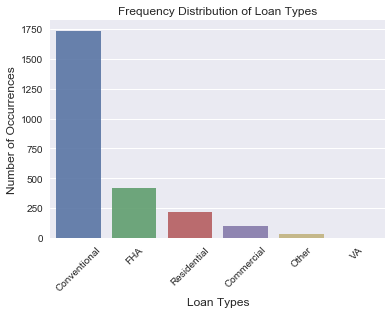

In [23]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
loan_type_count = data['Loan Type'].value_counts()
sns.set(style="darkgrid")
sns.barplot(loan_type_count.index, loan_type_count.values, alpha=0.9)
plt.title('Frequency Distribution of Loan Types')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Loan Types', fontsize=12)
plt.xticks(rotation=45)
plt.show()

Conventional loan type is top market for the Bank then FHA Loan Type

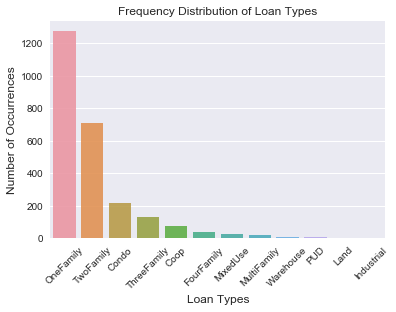

In [24]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
unit_type_count = data['Unit Type'].value_counts()
sns.set(style="darkgrid")
sns.barplot(unit_type_count.index, unit_type_count.values, alpha=0.9)
plt.title('Frequency Distribution of Loan Types')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Loan Types', fontsize=12)
plt.xticks(rotation=45)
plt.show()

One Family, Two Family and Condos are the top unit types for the Bank

# 6. Data Collection
Since we are only interested in the event log data we will only be using one of the tables. This table contains data about every mortgage application. Every action performed by the system or by a user on a mortgage application is logged, and the status before and after that specific action is logged. For our analysis we are mainly interested in the date and time at which each of the mortgage applications have entered the system.
Besides Mortgage Application DataSet, we have joined two separate (10 Years US Treasury Rate, Home Supply Index) with our existing Mortgage Application DataSet to enhance predictive power of our model.


# Encoding Categorical Data
There are different techniques to encode the categorical features to numeric quantities. 

The techniques are as following:

Replacing values

Encoding labels

One-Hot encoding

Binary encoding

Backward difference encoding

Miscellaneous features

Replace Values

Let's start with the most basic method, which is just replacing the categories with the desired numbers. This can be achieved with the help of the replace() function in pandas. The idea is that you have the liberty to choose whatever numbers we want to assign to the categories according to the business use case.

it's a good practice to typecast categorical features to a category dtype because they make the operations on such columns much faster than the object dtype. You can do the typecasting by using .astype() method on your columns like shown below:

In [25]:
data = pd.read_csv('c:/scripts/mwb2014.csv', index_col='Created Date', header=0, encoding='cp1252')
data_lc = data.copy()
data_lc['City'] = data_lc['City'].astype('category')
data_lc['Zip'] = data_lc['Zip'].astype('category')
data_lc['Loan Type'] = data_lc['Loan Type'].astype('category')
data_lc['Unit Type'] = data_lc['Unit Type'].astype('category')
data_lc['loan_purpose_code'] = data_lc['Loan Purpose'].astype('category')
print(data_lc.dtypes)
data_lc['lo_code'] = data_lc['Loan Officer Name'].astype('category')
lo_code =data_lc['lo_code']
data_lc.info()

First Name                  object
Last Name                   object
City                      category
State                       object
Zip                       category
Loan Amount                float64
Estimated Value              int64
Loan Purpose                object
Qualification FICO           int64
Is Primary Wage Earner        bool
Income Type                 object
Asset Docs                  object
Occupancy                   object
Unit Type                 category
Loan Type                 category
Lender Name                 object
Time                        object
Fix                           bool
ARM                           bool
CLTV                       float64
Loan Number                 object
Loan Officer Name           object
LoanInMonth                  int64
loan_purpose_code         category
dtype: object
<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 25 columns):
First Name                250

# Label Encoding
We can achieve the label encoding using scikit-learn's LabelEncoder:



In [26]:

from sklearn.preprocessing import LabelEncoder

lb_make = LabelEncoder()
data_lc['loan_purpose_code'] = lb_make.fit_transform(data_lc['Loan Purpose'])
data_lc['loan_type_code'] = lb_make.fit_transform(data_lc['Loan Type'])
data_lc['unit_type_code'] = lb_make.fit_transform(data_lc['Unit Type'])


data_lc.head(20) #Results in appending a new column to df

data_lc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 27 columns):
First Name                2501 non-null object
Last Name                 2501 non-null object
City                      2501 non-null category
State                     2501 non-null object
Zip                       2501 non-null category
Loan Amount               2501 non-null float64
Estimated Value           2501 non-null int64
Loan Purpose              2501 non-null object
Qualification FICO        2501 non-null int64
Is Primary Wage Earner    2501 non-null bool
Income Type               2501 non-null object
Asset Docs                2501 non-null object
Occupancy                 1846 non-null object
Unit Type                 2501 non-null category
Loan Type                 2501 non-null category
Lender Name               2501 non-null object
Time                      2501 non-null object
Fix                       2501 non-null bool
ARM                       2501 non

Label Encoding
Another approach is to encode categorical values with a technique called "label encoding", which allows you to convert each value in a column to a number. Numerical labels are always between 0 and n_categories-1.

We can do label encoding via attributes .cat.codes on your DataFrame's column.

In [27]:
data_lc['lo_code'] = data_lc['Loan Officer Name'].astype('category')
lo_code =data_lc['lo_code']
data_lc['city_code'] = data_lc['City'].cat.codes
data_lc['zip_code'] = data_lc['Zip'].cat.codes
lo_code = data_lc['lo_code'].cat.codes

In [28]:
print(lo_code)

Created Date
10/14/2014    15
10/14/2014    15
10/14/2014     9
10/14/2014    15
10/14/2014    11
10/14/2014    15
10/15/2014    11
10/15/2014    11
10/15/2014    15
10/16/2014    15
10/16/2014    15
10/16/2014    15
10/16/2014    16
10/17/2014    11
10/20/2014    30
10/20/2014     0
10/20/2014    16
10/20/2014    42
10/21/2014    42
10/21/2014    15
10/22/2014     7
10/22/2014     9
10/22/2014     7
10/23/2014    15
10/27/2014    11
10/27/2014     8
10/27/2014     8
10/27/2014     8
10/28/2014     9
10/28/2014    15
              ..
11/26/2018     3
11/26/2018     8
11/26/2018     8
11/27/2018    26
11/27/2018    31
11/27/2018    32
11/28/2018     1
11/28/2018    30
11/30/2018     9
11/30/2018     9
11/30/2018     0
12/1/2018      9
12/3/2018      9
12/4/2018      9
12/4/2018     17
12/4/2018     16
12/5/2018      9
12/6/2018     17
12/10/2018    26
12/10/2018    17
12/11/2018     9
12/14/2018    35
12/14/2018    35
12/17/2018    17
12/20/2018    34
12/20/2018     9
12/21/2018     0
1

# One-Hot encoding
The basic strategy is to convert each category value into a new column and assign a 1 or 0 (True/False) value to the column. This has the benefit of not weighting a value improperly.

In [29]:
data_lc = pd.get_dummies(data_lc, columns=['Fix'], prefix = ['Fix'])
data_lc['Fix_True']
data_lc['Fix_False']
data_lc['Fix_True'].head()
data_lc['Fix_True'].value_counts()

1    2242
0     259
Name: Fix_True, dtype: int64

In [30]:
data_lc[['Unit Type', 'unit_type_code']].head()
data_lc['Unit Type'].value_counts()
print(data_lc['Unit Type'].value_counts(), '\n ', data_lc['unit_type_code'].value_counts())

OneFamily      1276
TwoFamily       707
Condo           216
ThreeFamily     129
Coop             76
FourFamily       36
MixedUse         25
MultiFamily      20
Warehouse         8
PUD               6
Land              1
Industrial        1
Name: Unit Type, dtype: int64 
  7     1276
10     707
0      216
9      129
1       76
2       36
5       25
6       20
11       8
8        6
3        1
4        1
Name: unit_type_code, dtype: int64


In [31]:
data_lc[['Loan Type', 'loan_type_code']].head()
data_lc['Loan Type'].value_counts()
data_lc['unit_type_code'].value_counts()
print(data_lc['Loan Type'].value_counts(), ' \n ', data_lc['loan_type_code'].value_counts())

Conventional    1736
FHA              418
Residential      215
Commercial       100
Other             31
VA                 1
Name: Loan Type, dtype: int64  
  1    1736
2     418
4     215
0     100
3      31
5       1
Name: loan_type_code, dtype: int64


In [32]:
data_lc[['Loan Purpose', 'loan_purpose_code']].head()

,Loan Purpose,loan_purpose_code
Created Date,,
10/14/2014,Purchase,4
10/14/2014,Purchase,4
10/14/2014,Cash-Out Refi,0
10/14/2014,Cash-Out Refi,0
10/14/2014,Purchase,4


In [33]:
data_lc['loan_purpose_code'].value_counts()


4    1707
0     475
2     310
5       5
3       2
1       1
6       1
Name: loan_purpose_code, dtype: int64

Forward Fill Missing Data

In [34]:
#Categorical value 'loan_purpose_code' has been update based on frequency of the value_counts

data_lc=data_lc.fillna(method='ffill')

total_missing_data_lc=data_lc.isnull().sum()

US10Y= US10Y.fillna(method='ffill')

data_lc.info()


<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 30 columns):
First Name                2501 non-null object
Last Name                 2501 non-null object
City                      2501 non-null category
State                     2501 non-null object
Zip                       2501 non-null category
Loan Amount               2501 non-null float64
Estimated Value           2501 non-null int64
Loan Purpose              2501 non-null object
Qualification FICO        2501 non-null int64
Is Primary Wage Earner    2501 non-null bool
Income Type               2501 non-null object
Asset Docs                2501 non-null object
Occupancy                 1846 non-null object
Unit Type                 2501 non-null category
Loan Type                 2501 non-null category
Lender Name               2501 non-null object
Time                      2501 non-null object
ARM                       2501 non-null bool
CLTV                      2501 non

For Machine Learning Modeling, we need to create new Data Frame

In [35]:
model_data1 = data_lc[['Loan Amount', 'city_code', 'zip_code',  'loan_purpose_code', 'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True', 'CLTV', 'LoanInMonth']]
model_data1.columns


Index(['Loan Amount', 'city_code', 'zip_code', 'loan_purpose_code',
       'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True',
       'CLTV', 'LoanInMonth'],
      dtype='object')

In [36]:
model_data1.tail(10)

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth
Created Date,,,,,,,,,,
12/11/2018,550000.0,582,351,0,708,10,1,1,0.0,10
12/14/2018,850000.0,66,312,2,700,6,0,0,65.0,11
12/14/2018,600000.0,468,335,0,700,7,0,0,74.0,12
12/17/2018,943800.0,66,300,4,768,10,1,1,78.0,13
12/20/2018,526500.0,303,95,4,804,7,3,0,65.0,14
12/20/2018,870000.0,155,318,0,764,10,1,1,60.0,15
12/21/2018,633750.0,39,286,4,767,10,1,1,75.0,16
12/21/2018,861750.0,256,358,4,796,10,1,1,75.0,17
12/26/2018,1190000.0,583,337,4,778,10,0,1,70.0,18


In [37]:
total_missing_mode_data1=model_data1.isnull().sum()
print(total_missing_mode_data1)
model_data1.info()

Loan Amount           0
city_code             0
zip_code              0
loan_purpose_code     0
Qualification FICO    0
unit_type_code        0
loan_type_code        0
Fix_True              0
CLTV                  0
LoanInMonth           0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 10 columns):
Loan Amount           2501 non-null float64
city_code             2501 non-null int16
zip_code              2501 non-null int16
loan_purpose_code     2501 non-null int64
Qualification FICO    2501 non-null int64
unit_type_code        2501 non-null int64
loan_type_code        2501 non-null int64
Fix_True              2501 non-null uint8
CLTV                  2501 non-null float64
LoanInMonth           2501 non-null int64
dtypes: float64(2), int16(2), int64(5), uint8(1)
memory usage: 168.5+ KB


We can see that there is no missing value in model_data1

In [38]:
print('model_data1 Keys: ',model_data1.keys())
print('model_data1 shape: ',model_data1.shape)
model_data1.info()

model_data1 Keys:  Index(['Loan Amount', 'city_code', 'zip_code', 'loan_purpose_code',
       'Qualification FICO', 'unit_type_code', 'loan_type_code', 'Fix_True',
       'CLTV', 'LoanInMonth'],
      dtype='object')
model_data1 shape:  (2501, 10)
<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 10/14/2014 to 12/27/2018
Data columns (total 10 columns):
Loan Amount           2501 non-null float64
city_code             2501 non-null int16
zip_code              2501 non-null int16
loan_purpose_code     2501 non-null int64
Qualification FICO    2501 non-null int64
unit_type_code        2501 non-null int64
loan_type_code        2501 non-null int64
Fix_True              2501 non-null uint8
CLTV                  2501 non-null float64
LoanInMonth           2501 non-null int64
dtypes: float64(2), int16(2), int64(5), uint8(1)
memory usage: 168.5+ KB


Let's find out quaterly auto corellation of Loan amount

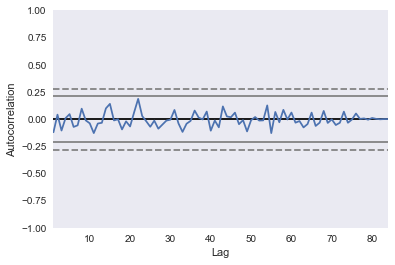

In [39]:
loan_amt=model_data1[['Loan Amount']]
pd.plotting.autocorrelation_plot(loan_amt[::30])

# Joining DataFrame
Join two DataFrames model_data1 & US10Y save the results in model_data2

In [40]:
US10Y = pd.read_csv('/scripts/US10Y.csv', header=0, index_col='DATE', encoding='cp1252')
#index_col='DATE'
US10Y.replace('.', -99999, inplace=True)

US10Y= US10Y.replace(to_replace=[-99999], value=[np.nan])

US10Y.tail()


,RATE
DATE,
12/21/2018,2.79
12/24/2018,2.74
12/25/2018,NaN
12/26/2018,2.81
12/27/2018,2.77


In [41]:
US10Y= US10Y.fillna(method='ffill')
US10Y= US10Y[['RATE']].astype('float64')
total_missing_rate=US10Y.isnull().sum()

print(total_missing_rate)

RATE    0
dtype: int64


In [42]:
model_data2 = model_data1.join(US10Y)
total_missing=model_data2.isnull().sum()
model_data2= model_data2.fillna(method='ffill')
total_missing_model_data2=model_data2.isnull().sum()
print(total_missing_model_data2)


Loan Amount           0
city_code             0
zip_code              0
loan_purpose_code     0
Qualification FICO    0
unit_type_code        0
loan_type_code        0
Fix_True              0
CLTV                  0
LoanInMonth           0
RATE                  0
dtype: int64


# Home Supply
US Home Supply directly impact Housing Market and Mortgage Market. We have collected the data from FRED
Integrate Monthly housing supply index data and merging with current dataset



In [43]:
home_supply = pd.read_csv('c:/scripts/MonHouseSupply.csv', header=0, index_col='DATE', encoding='cp1252')

home_supply.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, 10/14/2014 to 12/1/2018
Data columns (total 1 columns):
Home    51 non-null float64
dtypes: float64(1)
memory usage: 816.0+ bytes


In [44]:
total_missing_home_supply=home_supply.isnull().sum()

model_data = model_data2.join(home_supply)
total_missing=model_data.isnull().sum()
model_data= model_data.fillna(method='ffill')
total_missing_home_supply=model_data.isnull().sum()
print(total_missing_home_supply)


Loan Amount           0
city_code             0
zip_code              0
loan_purpose_code     0
Qualification FICO    0
unit_type_code        0
loan_type_code        0
Fix_True              0
CLTV                  0
LoanInMonth           0
RATE                  0
Home                  0
dtype: int64


In [45]:
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


In [46]:
model_data3=model_data.copy()
model_data3.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


# 5.2 DATA EXPLORATION
Since our dataset can be grouped per day to create meaningful visualizations. The dataset contains data from October 2014 until December 2018. In order to get a feel of the amount of mortgage applications per day and the distribution of the mortgage applications, different visualizations can be made using Python. Two graphs have been created, which can be found in Figure 1 and Figure 2. Both of these graphs only contain the amount of mortgage applications on the weekdays. As there are almost no applications coming in on the weekends they have been excluded from the graphs.
As can be seen from the graphs, there seems to be a seasonal pattern on a monthly level, but from these graphs it is not very clear. It also seems like there are some outliers, so these data points will have to be investigated to see if they will have to be included in our model, as there can be multiple underlying reasons for outliers in our dataset. It also seems there is an increase in mortgage applications during the last few months of each year. The amount of applications per day during these months is higher compared to the other months. This can have multiple explanations so this will have to be accounted for in the model.


In [47]:
loan_amount_data = data[data['Loan Amount'].isin(St)]
loan_amount_data.shape

ct_loan_amount=sum(ct_data['Loan Amount'])
fl_loan_amount=sum(fl_data['Loan Amount'])
ny_loan_amount=sum(ny_data['Loan Amount'])
nj_loan_amount=sum(nj_data['Loan Amount'])
pa_loan_amount=sum(pa_data['Loan Amount'])

loan_amount_per_state = [ct_loan_amount, fl_loan_amount, nj_loan_amount, ny_loan_amount, pa_loan_amount]

print('====================================================')
print('=========    Total Sales by State     ==============')
print(' ')
print('Total Sales in Cunnecticut   : $', ct_loan_amount)
print('Total Sales in Florida       : $', fl_loan_amount)
print('Total Sales in New York      : $', ny_loan_amount)
print('Total Sales in New Jersey    : $', nj_loan_amount)
print('Total Sales in Pennsylvania  : $', pa_loan_amount)
print(' ')
print('====================================================')
print(' ')

#####################################
loan_types=data['Loan Type'].unique()
group_loan_types=data.groupby(data['Loan Type']).size()
print('Unique Loan Types        : ', loan_types)
print(' ')
print('====================================================')

print('Number of loan per Types : ', group_loan_types)

print(' ')
print('====================================================')
print(' ')


=========    Total Sales by State     ==============
 
Total Sales in Cunnecticut   : $ 3604641.0
Total Sales in Florida       : $ 3371495.0
Total Sales in New York      : $ 868836552.2799997
Total Sales in New Jersey    : $ 236456261.05999997
Total Sales in Pennsylvania  : $ 600920.0
 
 
Unique Loan Types        :  ['Residential' 'FHA' 'Commercial' 'Conventional' 'Other' 'VA']
 
Number of loan per Types :  Loan Type
Commercial       100
Conventional    1736
FHA              418
Other             31
Residential      215
VA                 1
dtype: int64
 
 


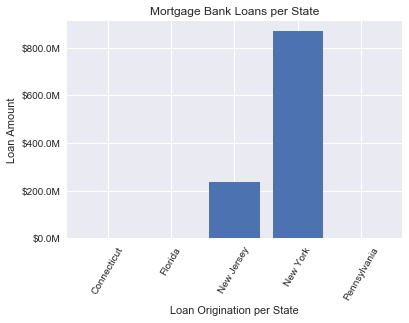

In [48]:
from matplotlib.ticker import FuncFormatter


x = np.arange(5)
money = [1.5e5, 2.5e6, 5.5e6, 1.0e7, 2.0e7, 3.0e7, 4.0e7, 5.0e7, 6.0e7]


def millions(x, pos):
    'The two args are the value and tick position'
    return '$%1.1fM' % (x * 1e-6)


formatter = FuncFormatter(millions)

fig, ax = plt.subplots()
ax.yaxis.set_major_formatter(formatter)
plt.bar(St, loan_amount_per_state)
plt.xticks(x, ('Connecticut', 'Florida', 'New Jersey', 'New York', 'Pennsylvania'))
plt.ylabel('Loan Amount')
plt.xlabel('Loan Origination per State')
plt.xticks(rotation=60)
plt.title('Mortgage Bank Loans per State')
plt.show()

Eventhough Bank is Licensed for business in NY, NJ, CT, PA and FL, their strong mortgage market is in NY & NI

          Zip  Loan Amount  Estimated Value  Qualification FICO  \
0.05   7083.0     150000.0         205275.0               636.0   
0.95  11756.0     840000.0        1400000.0               803.0   

      Is Primary Wage Earner  Fix  ARM  CLTV  LoanInMonth  
0.05                     0.0  0.0  0.0   0.0          3.0  
0.95                     1.0  1.0  1.0  96.0         56.0  
0.05    150000.0
0.95    840000.0
Name: Loan Amount, dtype: float64
0.1    200000.0
0.9    696500.0
Name: Loan Amount, dtype: float64
0.1    200000.0
0.9    696500.0
Name: Loan Amount, dtype: float64
['CT', 'FL', 'NJ', 'NY', 'PA']


C:\Users\achow\Anaconda3\lib\site-packages\pandas\core\indexing.py:870: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_lowerdim(tup)


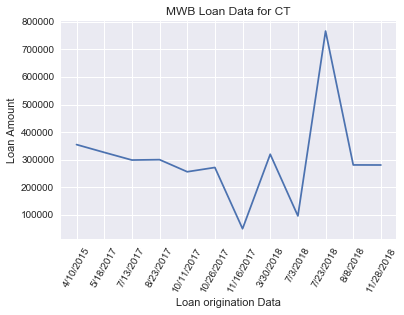

In [49]:
data = pd.read_csv('c:/scripts/mwb2014.csv', header=0, encoding='cp1252')
print(data.quantile([0.05, 0.95]))
print(data['Loan Amount'].quantile([0.05, 0.95]))
print(data['Loan Amount'].quantile([0.1, 0.90]))

print(data['Loan Amount'].quantile([0.1, 0.90]))

St=['CT', 'FL', 'NJ', 'NY', 'PA']
print(St)

#DataFrame subsets by State
ct_data = data[data['State'].isin(['CT'])]
fl_data = data[data['State'].isin(['FL'])]
ny_data = data[data['State'].isin(['NY'])]
nj_data = data[data['State'].isin(['NJ'])]
pa_data = data[data['State'].isin(['PA'])]


#Selecting data per column
ct_lo_amount = ct_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'unit_type_code', 'Loan Type')]
fl_lo_amount = fl_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
nj_lo_amount = nj_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
ny_lo_amount = ny_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
pa_lo_amount = pa_data.loc[:,('Created Date', 'First Name', 'Last Name', 'Loan Amount', 'City', 'Unit Type', 'Loan Type')]
#subset = df.loc[:,('A':'C', 'E', 'G':'I')]
#print(ct_data[[1], [2], [8]])

#Plot loan amount per Statae
plt.xlabel('Loan origination Data')
plt.xticks(rotation=60)
plt.ylabel('Loan Amount')
plt.title('MWB Loan Data for CT')
plt.plot(ct_data['Created Date'], ct_data['Loan Amount'])

Here is the Loan amount Distribution for CT State

In [50]:
print('==============================')
print(' ')
#Unit Type Loan Data
total_unit_type = data.groupby(data['Unit Type']).size()
print('Loan originated in all States per unit types : \n', total_unit_type)

print('==============================')
print(' ')

#Unit Type Loan Data for CT
ct_data_unit_type=ct_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in Cunnecticut per unit types : \n', ct_data_unit_type)

print('==============================')
print(' ')

#Unit Type Loan Data for FL
fl_data_unit_type=fl_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in Florida per unit types : \n', fl_data_unit_type)
print('==============================')
print(' ')

#Unit Type Loan Data for NJ
nj_data_unit_type=nj_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in New Jersey per unit types : \n', nj_data_unit_type)

print('==============================')
print(' ')


#Unit Type Loan Data for NY
ny_data_unit_type=ny_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in New York per unit types : \n', ny_data_unit_type)

print('==============================')
print(' ')

#Unit Type Loan Data for PA
pa_data_unit_type=pa_data['Loan Amount'].groupby(data['Unit Type']).size()
print('Loan originated in Pennsylvania per unit types : \n', pa_data_unit_type)

print('==============================')
print(' ')

#Unit Type Loan Data for CT
ct_data['Loan Amount'].groupby(data['Unit Type']).size()


 
Loan originated in all States per unit types : 
 Unit Type
Condo           216
Coop             76
FourFamily       36
Industrial        1
Land              1
MixedUse         25
MultiFamily      20
OneFamily      1276
PUD               6
ThreeFamily     129
TwoFamily       707
Warehouse         8
dtype: int64
 
Loan originated in Cunnecticut per unit types : 
 Unit Type
OneFamily      9
ThreeFamily    3
Name: Loan Amount, dtype: int64
 
Loan originated in Florida per unit types : 
 Unit Type
Condo         1
OneFamily    11
Name: Loan Amount, dtype: int64
 
Loan originated in New Jersey per unit types : 
 Unit Type
Condo          140
FourFamily       2
OneFamily      448
PUD              1
ThreeFamily     10
TwoFamily       70
Name: Loan Amount, dtype: int64
 
Loan originated in New York per unit types : 
 Unit Type
Condo           75
Coop            76
FourFamily      34
Industrial       1
Land             1
MixedUse        25
MultiFamily     20
OneFamily      805
PUD              5

Unit Type
OneFamily      9
ThreeFamily    3
Name: Loan Amount, dtype: int64

Loan data based on Unit Types (One Fami, Two Family etc) per State

In [51]:
lo_data = pd.read_csv('c:/scripts/mwb2014.csv', header=0, index_col = 'Loan Officer Name', encoding='cp1252')

# Create a separate dataframe with the columns ['', 'total', 'voters']: results
lo_df = lo_data[['Created Date', 'Loan Amount', 'Unit Type', 'Loan Type', 'City', 'Zip']]

# Print the output of results.head()
print(lo_df.head())

print(lo_df.count())

print('=======================================================================')
print('**********************  Loan Statistics for Mortgage Bank ***********************')
print(' ')


lo_df.describe()

lo_df.describe().transpose()

from scipy.stats import scoreatpercentile
import numpy as np

q0 = scoreatpercentile(lo_df['Loan Amount'],10)
q1 = scoreatpercentile(lo_df['Loan Amount'],25)
q2 = scoreatpercentile(lo_df['Loan Amount'],55)
q3 = scoreatpercentile(lo_df['Loan Amount'],75)
q4 = scoreatpercentile(lo_df['Loan Amount'],90)


print('Average Loan Amount is               :  $', '%.2f' %lo_df['Loan Amount'].mean())
print('Median Loan Amount is                :  $', '%.2f' %lo_df['Loan Amount'].median())
print(' ')
print('Standard deviation of Loan Amount is :  $', '%.2f' %lo_df['Loan Amount'].std())
print(' ')
print('Minimum Loan Amount is               :  $', '%.2f' %lo_df['Loan Amount'].min())
print('Maximum Loan Amount is               :  $', '%.2f' %lo_df['Loan Amount'].max())
print(' ')
print('Total of Loan Amount is              :  $', '%.2f' %lo_df['Loan Amount'].sum())
print(' ')
print('10% of Loan Amount is below               :  $', '%.2f' %q0)
print('25% of Loan Amount is below               :  $', '%.2f' %q1)
print('50% of Loan Amount is below               :  $', '%.2f' %q2)
print('75% of Loan Amount is below               :  $', '%.2f' %q3)
print('90% of Loan Amount is below               :  $', '%.2f' %q4)
print(' ')
print('==========================================================================')

                  Created Date  Loan Amount  Unit Type    Loan Type  \
Loan Officer Name                                                     
73ch126 61g45d3s    10/14/2014     506250.0  TwoFamily  Residential   
73ch126 61g45d3s    10/14/2014     206250.0      Condo  Residential   
63s1 63             10/14/2014     648700.0  TwoFamily  Residential   
73ch126 61g45d3s    10/14/2014     412750.0  TwoFamily  Residential   
7189r22t Bh1s38     10/14/2014     522588.0  TwoFamily          FHA   

                              City    Zip  
Loan Officer Name                          
73ch126 61g45d3s         Edgewater   7020  
73ch126 61g45d3s    EAST BRUNSWICK   8816  
63s1 63                   WOODSIDE  11377  
73ch126 61g45d3s   Jackson Heights  11370  
7189r22t Bh1s38     Queens Village  10461  
Created Date    2501
Loan Amount     2501
Unit Type       2501
Loan Type       2501
City            2501
Zip             2501
dtype: int64
**********************  Loan Statistics for Mortgage Ba

Loan Statistics for the Bank

**************** Qualification FICO  Statistics for Mortgage Bank ***************
 
Average FICO is                  :  $ 727.81
Median FICO is                   :  $ 732.00
Standard deviation is            :  $ 56.61
Minimum FICO is                  :  $ 0.00
Maximum FICO is                  :  $ 825.00
 
5% of FICO is below              :  $ 636.00
10% of FICO is below             :  $ 653.00
25% of FICO is below             :  $ 693.00
40% of FICO is below             :  $ 716.00
50% of FICO is below             :  $ 732.00
65% of FICO is below             :  $ 755.00
75% of FICO is below             :  $ 771.00
90% of FICO is below             :  $ 795.00
95% of FICO is below             :  $ 803.00
 


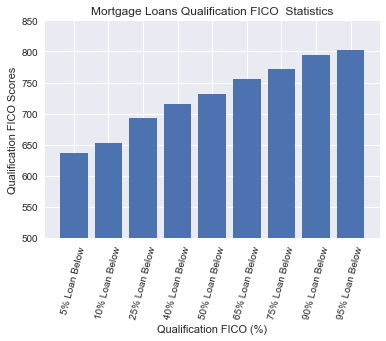

In [52]:
print('=======================================================================')
print('**************** Qualification FICO  Statistics for Mortgage Bank ***************')
print(' ')


lo_df.describe()

fico = lo_data[['Qualification FICO']]
fico.describe()

from scipy.stats import scoreatpercentile
import numpy as np

fico_q7 = scoreatpercentile(lo_data['Qualification FICO'],5)
fico_q0 = scoreatpercentile(lo_data['Qualification FICO'],10)
fico_q1 = scoreatpercentile(lo_data['Qualification FICO'],25)
fico_q5 = scoreatpercentile(lo_data['Qualification FICO'],40)
fico_q2 = scoreatpercentile(lo_data['Qualification FICO'],50)
fico_q6 = scoreatpercentile(lo_data['Qualification FICO'],65)
fico_q3 = scoreatpercentile(lo_data['Qualification FICO'],75)
fico_q4 = scoreatpercentile(lo_data['Qualification FICO'],90)
fico_q8 = scoreatpercentile(lo_data['Qualification FICO'],95)


print('Average FICO is                  :  $', '%.2f' %lo_data['Qualification FICO'].mean())
print('Median FICO is                   :  $', '%.2f' %lo_data['Qualification FICO'].median())
print('Standard deviation is            :  $', '%.2f' %lo_data['Qualification FICO'].std())
print('Minimum FICO is                  :  $', '%.2f' %lo_data['Qualification FICO'].min())
print('Maximum FICO is                  :  $', '%.2f' %lo_data['Qualification FICO'].max())
print(' ')
print('5% of FICO is below              :  $', '%.2f' %fico_q7)
print('10% of FICO is below             :  $', '%.2f' %fico_q0)
print('25% of FICO is below             :  $', '%.2f' %fico_q1)
print('40% of FICO is below             :  $', '%.2f' %fico_q5)
print('50% of FICO is below             :  $', '%.2f' %fico_q2)
print('65% of FICO is below             :  $', '%.2f' %fico_q6)
print('75% of FICO is below             :  $', '%.2f' %fico_q3)
print('90% of FICO is below             :  $', '%.2f' %fico_q4)
print('95% of FICO is below             :  $', '%.2f' %fico_q8)

print(' ')
print('==========================================================================')


fico_score = [fico_q7, fico_q0, fico_q1, fico_q5, fico_q2, fico_q6, fico_q3, fico_q4, fico_q8]
fico_pct=['5% Loan Below', '10% Loan Below', '25% Loan Below', '40% Loan Below', '50% Loan Below', '65% Loan Below', '75% Loan Below','90% Loan Below', '95% Loan Below']
plt.xticks(rotation=75)
plt.ylim((500,850))
plt.bar(fico_pct, fico_score)
plt.ylabel('Qualification FICO Scores')
plt.xlabel('Qualification FICO (%)')
plt.title('Mortgage Loans Qualification FICO  Statistics')
plt.show()


Mortgage Bank FICO Score Statistics

**************** Mortgage Loan Ofiicer Sales Volume per Loan Type ***************
 
                                Loan Amount
Loan Officer Name Loan Type                
17281 Kh18        Commercial      990000.00
                  Conventional  17532050.00
                  FHA            7120707.00
                  Residential    4305900.00
185j t2st t2st2r  Conventional    963500.00
18g261 B5c3ch     Commercial      640000.00
                  Conventional    975000.00
1b5 Ch4wdh5ry     Commercial     1190000.00
                  Conventional  12606550.75
                  FHA            4841882.10
                  Other           559375.00
1s3f Kh18         Conventional   1461750.00
26g38 B528c48s2j4 Conventional   1165000.00
2d758d 9393t482   Conventional   1466550.00
2dw38 81v1rr2t2   Commercial     1659000.00
                  Conventional   8812068.00
                  FHA            3661645.68
                  Residential    1201500.00
6366y 622         Commercial     212

Text(0,0.5,'Sales per Unit Type')

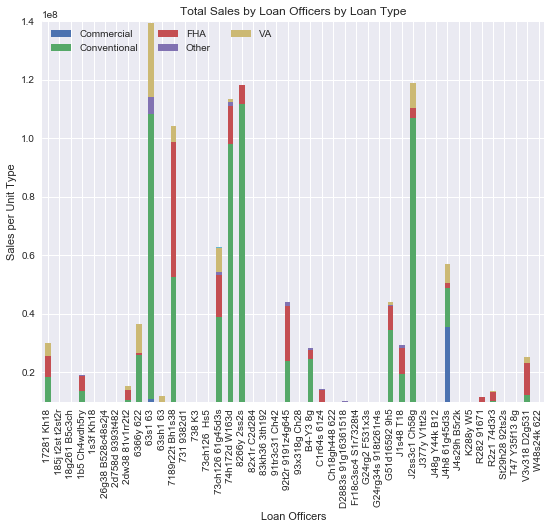

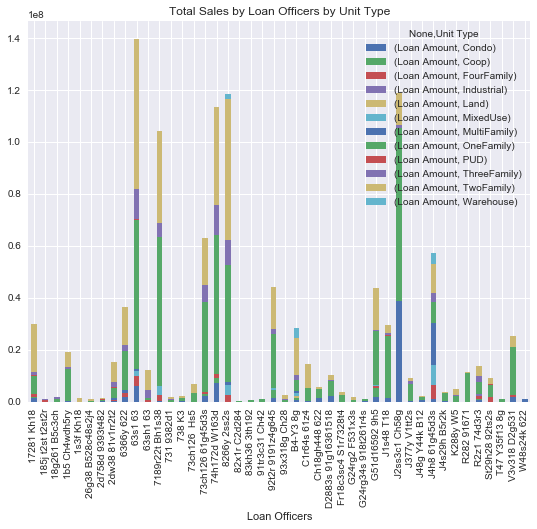

In [53]:
%matplotlib inline
print('==============================================================================')
print('**************** Mortgage Loan Ofiicer'' Sales Volume per Loan Type ***************')
print(' ')


###########################

lo_loan = data[['Loan Officer Name', 'Loan Type', 'Created Date', 'Loan Amount']]

#We can use groupby to organize the data by category and name.
lo_loan_group = lo_loan.groupby(['Loan Officer Name', 'Loan Type']).sum()

lo_loan_group_count = lo_loan.groupby(['Loan Officer Name', 'Loan Type']).count()

print(lo_loan_group)
print(lo_loan_group_count)

lo_loan['Loan Type'].describe()

'''The category representation looks good but we need to break it apart
to graph it as a stacked bar graph. unstack can do this for us.'''

lo_loan_group.unstack().head()

lo_loan_group_plot = lo_loan_group.unstack().plot(kind='bar',stacked=True,title="Total Sales by Loan Officers by Loan Type",figsize=(9, 7))
lo_loan_group_plot.set_xlabel("Loan Officers")
lo_loan_group_plot.set_ylabel("Sales per Loan Type")
lo_loan_group_plot.legend(["Commercial","Conventional","FHA","Other","VA"], loc=2,ncol=3)
plt.ylim(10000000, 140000000)


print('==============================================================================')
print('**************** MWB Loan Ofiicers Sales Volume per Unit Type ***************')
print(' ')

lo_unit = data[['Loan Officer Name', 'Unit Type', 'Created Date', 'Loan Amount']]

lo_unit_group = lo_unit.groupby(['Loan Officer Name', 'Unit Type']).sum()

lo_unit_group_count = lo_unit.groupby(['Loan Officer Name', 'Unit Type']).count()

print(lo_unit_group)
print(lo_unit_group_count)

lo_unit['Unit Type'].describe()


lo_unit_group.unstack().head()

lo_unit_group_plot = lo_unit_group.unstack().plot(kind='bar',stacked=True,title="Total Sales by Loan Officers by Unit Type",figsize=(9, 7))
lo_unit_group_plot.set_xlabel("Loan Officers")
lo_loan_group_plot.set_ylabel("Sales per Unit Type")

MWB Loan Ofiicers Sales Volume per Unit Type

The category representation looks good also displayed stacked bar graph and. unstack can do this for us.'''
Mortgage Loan Ofiicer'' Sales Volume per Loan Type displayed and grahically displayed Loan Officer’s Sales Volume per Unit Type.

In [54]:
#Importing data with date as without index
data = pd.read_csv('c:/scripts/mwb2014.csv', header=0, encoding='cp1252')



One of the really cool things that Pandas allows us to do is resample the data. We want to look at the data by month, we can easily resample and sum it all up. I’m using ‘M’ as the period for resampling which means the data should be resampled on a month boundary.

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2501 entries, 2014-10-14 to 2018-12-27
Data columns (total 2 columns):
Loan Amount     2501 non-null float64
Created Date    2501 non-null object
dtypes: float64(1), object(1)
memory usage: 138.6+ KB


C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...)..apply(<func>)
  from ipykernel import kernelapp as app


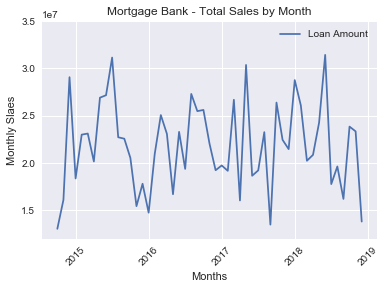

In [55]:
loan_patterns = data[['Loan Amount', 'Created Date']]
loan_patterns.head()
'''
If we want to analyze the data by date,
we need to set the date column as the index using set_index .
'''
#Convert Date Index
loan_patterns['date'] = pd.DatetimeIndex(data['Created Date'])

loan_patterns = loan_patterns.set_index('date')
loan_patterns.index
loan_patterns.head()
monthly_loan_rev=loan_patterns.resample('M').sum()
loan_patterns.info()
loan_patterns_month_plot = loan_patterns.resample('M',how=sum).plot(title="Mortgage Bank - Total Sales by Month",legend=True)
loan_patterns_month_plot.set_xlabel("Months")
loan_patterns_month_plot.set_ylabel("Monthly Slaes")
plt.xticks(rotation=45)
plt.ylim((12000000, 35000000))
fig = loan_patterns_month_plot.get_figure()


We can see that monthly mortgage loan sales volume varies between 
15Mand
15Mand
32M. Another interesting find is Loan sales are at the peak during summer seasons. Winter sales are normally slow but 2018 was an exception.

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2501 entries, 2014-10-14 to 2018-12-27
Data columns (total 2 columns):
Loan Amount     2501 non-null float64
Created Date    2501 non-null object
dtypes: float64(1), object(1)
memory usage: 138.6+ KB


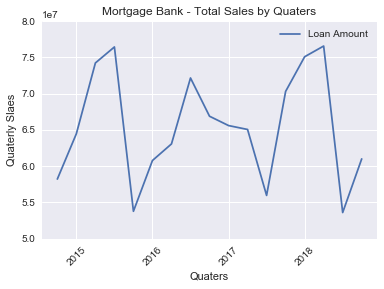

In [56]:
loan_patterns.resample('Q').sum()
monthly_loan_rev=loan_patterns.resample('Q').sum()
loan_patterns.info()
loan_patterns_month_plot = loan_patterns.resample('Q').sum().plot(title="Mortgage Bank - Total Sales by Quaters",legend=True)
loan_patterns_month_plot.set_xlabel("Quaters")
loan_patterns_month_plot.set_ylabel("Quaterly Slaes")
plt.xticks(rotation=45)
plt.ylim((50000000, 80000000))
fig = loan_patterns_month_plot.get_figure()
fig.savefig("c:/scripts/MWB/loan_patterns_month_plot.png")

 Mortgage Bank's Quarterly Sales Revenue varies between 50 (millions) and 77 (millions)

April        8.013326e+07
August       9.292258e+07
December     1.013868e+08
February     8.921963e+07
January      8.160879e+07
July         8.750879e+07
June         1.005480e+08
March        9.510573e+07
May          9.824521e+07
November     9.936588e+07
October      1.094211e+08
September    7.772900e+07
Name: Loan Amount, dtype: float64
Y    1.113195e+09
Name: Loan Amount, dtype: float64
Fri    2.052834e+08
Mon    2.048027e+08
Sat    1.376921e+07
Sun    1.584283e+07
Thu    2.190100e+08
Tue    2.355647e+08
Wed    2.189220e+08
Name: Loan Amount, dtype: float64
April        8.013326e+07
August       9.292258e+07
December     1.013868e+08
February     8.921963e+07
January      8.160879e+07
July         8.750879e+07
June         1.005480e+08
March        9.510573e+07
May          9.824521e+07
November     9.936588e+07
October      1.094211e+08
September    7.772900e+07
Name: Loan Amount, dtype: float64
Y    1.113195e+09
Name: Loan Amount, dtype: float64


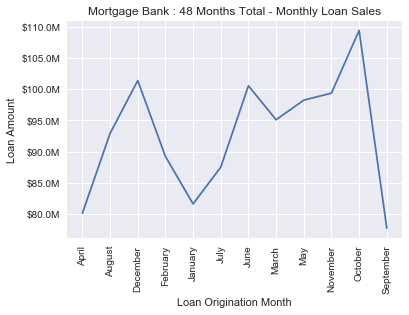

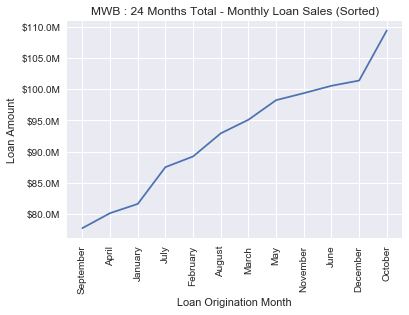

In [57]:
#Monthy Sales Sorted
'''
Grouping on a function of the index
Groupby operations can also be performed on transformations
of the index values. In the case of a DateTimeIndex,
we can extract portions of the datetime over which to group.
'''

data = pd.read_csv('c:/scripts/mwb2014.csv', index_col='Created Date', parse_dates=True, encoding='cp1252')


# Create a groupby object: by_day
by_month = data.groupby(data.index.strftime('%B'))
by_year = data.groupby(data.index.strftime('Y'))
by_day = data.groupby(data.index.strftime('%a'))

'''
%a - day
%m - month (01 to 12)
%b - abbreviated month name
%B - full month name
%y - year without a century (range 00 to 99)
%Y - year including the century
'''


# Create sum: units_sum
monthly_loan_amount_sum = by_month['Loan Amount'].sum()
daily_loan_amount_sum = by_day['Loan Amount'].sum()

yearly_loan_amount_sum = by_year['Loan Amount'].sum()

monthly_loan_amount_sum = monthly_loan_amount_sum

# Print units_sum
print(monthly_loan_amount_sum)
print(yearly_loan_amount_sum)
print(daily_loan_amount_sum)

formatter = FuncFormatter(millions)
fig, ax = plt.subplots()
ax.yaxis.set_major_formatter(formatter)
plt.xlabel('Loan Origination Month')
plt.ylabel('Loan Amount')
plt.title('Mortgage Bank : 48 Months Total - Monthly Loan Sales')
plt.xticks(rotation=90)
plt.plot(monthly_loan_amount_sum)


monthly_loan_amount_sum_sorted= monthly_loan_amount_sum.sort_values()

# Print units_sum
print(monthly_loan_amount_sum)
print(yearly_loan_amount_sum)

formatter = FuncFormatter(millions)
fig, ax = plt.subplots()
ax.yaxis.set_major_formatter(formatter)
plt.xlabel('Loan Origination Month')
plt.ylabel('Loan Amount')
plt.title('MWB : 24 Months Total - Monthly Loan Sales (Sorted)')
plt.xticks(rotation=90)
plt.plot(monthly_loan_amount_sum_sorted)



Monthly Worst Sales: January, April and September and Best is June, December and October.

In [58]:
lo_zip=data.groupby(['Loan Officer Name', 'Zip'])
lo_zip_count = lo_zip['Zip'].count()
lo_zip_filt = lo_zip.filter(lambda c:c['Zip'].count() > 3)

lo_zip_filt_top10= (lo_zip_filt.groupby(['Zip']).size()).sort_values(ascending=False)

print('Top 10 marketing location by Zip Codes : ', lo_zip_filt_top10.head(10))


Top 10 marketing location by Zip Codes :  Zip
7650     79
11223    62
11229    50
11432    37
11208    33
7621     30
11355    30
11103    29
11203    28
11420    25
dtype: int64


Top Ten Loan Origination Zip COde. Bank can focus more on marketting to generate more revenue

C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).count()
C:\U

2017 :             Created Date  LoanInMonth
date                                
2017-01-02     1/2/2017            1
2017-01-03     1/3/2017            2
2017-01-03     1/3/2017            3
2017-01-04     1/4/2017            4
2017-01-04     1/4/2017            5
2017-01-04     1/4/2017            6
2017-01-04     1/4/2017            7
2017-01-04     1/4/2017            8
2017-01-05     1/5/2017            9
2017-01-05     1/5/2017           10
2017-01-09     1/9/2017           11
2017-01-09     1/9/2017           12
2017-01-11    1/11/2017           13
2017-01-11    1/11/2017           14
2017-01-12    1/12/2017           15
2017-01-13    1/13/2017           31
2017-01-16    1/16/2017           17
2017-01-16    1/16/2017           18
2017-01-16    1/16/2017           19
2017-01-17    1/17/2017           20
2017-01-17    1/17/2017           21
2017-01-17    1/17/2017           22
2017-01-18    1/18/2017           23
2017-01-19    1/19/2017           24
2017-01-19    1/19/2017       

TypeError: list indices must be integers or slices, not str

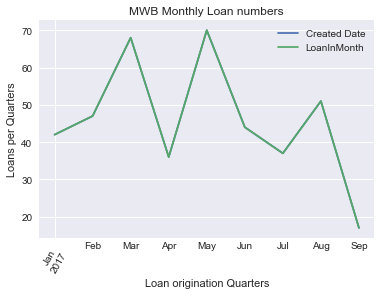

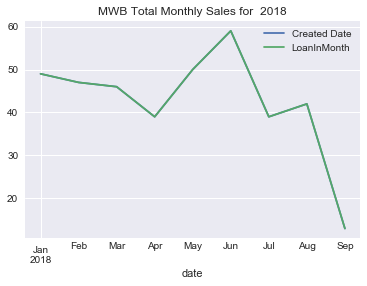

In [59]:

import datetime
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import calendar
from time import strptime
#data = pd.read_csv('c:/scripts/mwb2014.csv', index_col='Created Date', header=0, encoding='cp1252')
data = pd.read_csv('c:/scripts/mwb2014.csv', header=0, encoding='cp1252')

M_loan_city_num=data[['Created Date', 'LoanInMonth']]
M_loan_city_num['date'] = pd.DatetimeIndex(data['Created Date'])
M_loan_city_num = M_loan_city_num.set_index('date')

M_loan_city_num_2017 = M_loan_city_num.loc['2017-1-1':'2017-9-16']
#lender_loan_amount_sum_2017 = lender_loan_amount_2017.groupby(['Lender Name']).sum()
#lender_loan_amount_sum_2017 = lender_loan_amount_sum_2017['Loan Amount'].sort_values(ascending=False)
print('2017 : ' , M_loan_city_num_2017)
M_loan_city_num_2018 = M_loan_city_num.loc['2018-1-1':'2018-9-16']
#lender_loan_amount_sum_2018 = lender_loan_amount_2018.groupby(['Lender Name']).sum()
#lender_loan_amount_sum_2018 = lender_loan_amount_sum_2018['Loan Amount'].sort_values(ascending=False)
print('2018 : ', M_loan_city_num_2018)

M17= M_loan_city_num_2017.resample('M', how='count')
M17.index=M17.index.month
M18= M_loan_city_num_2018.resample('M', how='count')
M18.index=M18.index.month
print(M_loan_city_num_2017.resample('M', how='count'))
print(M_loan_city_num_2018.resample('M', how='count'))

M_loan_city_num_2017_plot = M_loan_city_num_2017.resample('M',how='count').plot(title="MWB Total Monthly Sales for 2017",legend=True)

plt.xlabel('Loan origination Quarters')
plt.xticks(rotation=60)
plt.ylabel('Loans per Quarters')
plt.title('MWB Monthly Loan numbers')

M_loan_city_num_2018_plot = M_loan_city_num_2018.resample('M',how='count').plot(title="MWB Total Monthly Sales for  2018",legend=True)
plt.xticks(range(len(M17)),[calendar.month_name[month] for month in M17], rotation=60)

plt.xlabel('Loan origination Months')
plt.xticks(rotation=60)
plt.ylabel('Loans per Months')
plt.title('MWB Monthly Loan numbers')
#plt.xticks(x, ('Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep'))
plt.show()

We can see number of loan closed per month (Comparing data for 2017 & 2018)

C:\Users\achow\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


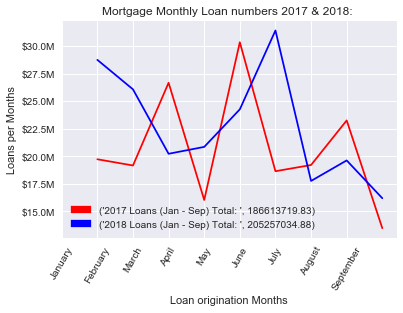

In [61]:
import matplotlib.patches as mpatches
data = pd.read_csv('c:/scripts/mwb2014.csv', encoding='cp1252')

M_loan_amount_num=data[['Created Date', 'Loan Amount']]

M_loan_amount_num['date'] = pd.DatetimeIndex(data['Created Date'])
M_loan_amount_num = M_loan_amount_num.set_index('date')

M_loan_amount_num_2017 = M_loan_amount_num.loc['2017-1-1':'2017-9-30']
#print('2017 : ' , M_loan_amount_num_2017)
M_loan_amount_num_2018 = M_loan_amount_num.loc['2018-1-1':'2018-9-30']
#print('2018 : ', M_loan_amount_num_2018)

# =============================================================================
# by_month = data.groupby(data.index.strftime('%B'))
# by_year = data.groupby(data.index.strftime('Y'))
# by_day = data.groupby(data.index.strftime('%a'))
#
# =============================================================================
M_amount_17= M_loan_amount_num_2017.resample('M').sum()
M_amount_17.index=M_amount_17.index.month
M_amount_18= M_loan_amount_num_2018.resample('M').sum()
M_amount_18.index=M_amount_18.index.month
M_amount_17.sum()
M_amount_18.sum()

from matplotlib.ticker import FuncFormatter


x = np.arange(5)
money = [1.5e5, 2.5e6, 5.5e6, 1.0e7, 2.0e7, 3.0e7, 4.0e7, 5.0e7, 6.0e7]


def millions(x, pos):
    'The two args are the value and tick position'
    return '$%1.1fM' % (x * 1e-6)


formatter = FuncFormatter(millions)

fig, ax = plt.subplots()
ax.yaxis.set_major_formatter(formatter)

plt.plot(M_amount_17, color='red')
plt.plot(M_amount_18, color='blue')

red_patch = mpatches.Patch(color='red', label=('2017 Loans (Jan - Sep) Total: ', M_amount_17['Loan Amount'].sum()) )

blue_patch = mpatches.Patch(color='blue', label=('2018 Loans (Jan - Sep) Total: ',  M_amount_18['Loan Amount'].sum()) )

plt.legend(handles=[red_patch, blue_patch])
#print('Total Loans in 2017 :', M17['Created Date'].sum(), '\nTotal Loans in 2018 :', M18['Created Date'].sum())


plt.xticks(range(len(M17)), [calendar.month_name[month] for month in M17.index], rotation=60)

plt.xlabel('Loan origination Months')
#plt.xticks(rotation=60)
plt.ylabel('Loans per Months')
plt.title('Mortgage Monthly Loan numbers 2017 & 2018: ')

plt.show()

Comparing Mortgage Monthly Loan numbers 2017 & 2018

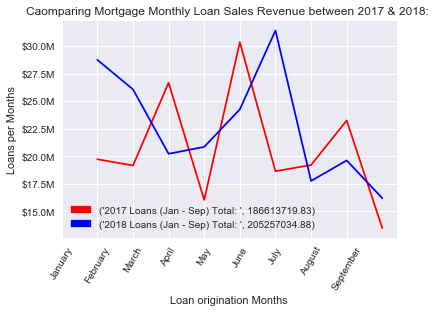

In [62]:
M_amount_17= M_loan_amount_num_2017.resample('M').sum()
M_amount_17.index=M_amount_17.index.month
M_amount_18= M_loan_amount_num_2018.resample('M').sum()
M_amount_18.index=M_amount_18.index.month
M_amount_17.sum()
M_amount_18.sum()

from matplotlib.ticker import FuncFormatter


x = np.arange(5)
money = [1.5e5, 2.5e6, 5.5e6, 1.0e7, 2.0e7, 3.0e7, 4.0e7, 5.0e7, 6.0e7]


def millions(x, pos):
    'The two args are the value and tick position'
    return '$%1.1fM' % (x * 1e-6)


formatter = FuncFormatter(millions)

fig, ax = plt.subplots()
ax.yaxis.set_major_formatter(formatter)

plt.plot(M_amount_17, color='red')
plt.plot(M_amount_18, color='blue')

red_patch = mpatches.Patch(color='red', label=('2017 Loans (Jan - Sep) Total: ', M_amount_17['Loan Amount'].sum()) )

blue_patch = mpatches.Patch(color='blue', label=('2018 Loans (Jan - Sep) Total: ',  M_amount_18['Loan Amount'].sum()) )

plt.legend(handles=[red_patch, blue_patch])
#print('Total Loans in 2017 :', M17['Created Date'].sum(), '\nTotal Loans in 2018 :', M18['Created Date'].sum())


plt.xticks(range(len(M17)), [calendar.month_name[month] for month in M17.index], rotation=60)

plt.xlabel('Loan origination Months')
#plt.xticks(rotation=60)
plt.ylabel('Loans per Months')
plt.title('Caomparing Mortgage Monthly Loan Sales Revenue between 2017 & 2018: ')

plt.show()


In 2017, Mortgage Bank sales revenue was (M_amount_17.sum()) =  $180M

In 2018,  Mortgage Bank sales revenue was (M_amount_18.sum()) = $197M

We have seen numbers of loan closed went down, but sales revenue went up. Main reason behind this, housing price went up, which drive average loan amount to increase. As a result total sales went up for 2018 comparing 2017


In [63]:
print('Pearson correlation coefficient between Loan number and Loan Revenue: ', r_monthly_loan_num_data_monthly_loan_rev)


Pearson correlation coefficient between Loan number and Loan Revenue:  (array([0.84472037]), array([6.63988048e-15]))


As we have seen earlier earlier, there is positive strong correlation (0.844) between Loan number and Loan Revenue.

Monthly Loan numbers and Monthly Sales volumes are strongly positively correlated. Once we analyze number of the loans closed per month, we find the similarity between sales volume and loan numbers. As average loan numbers goes up, total monthly sales volume goes up. Any given months, if the number of loans closed are higher; we find that average loan amounts are low for that particular months. In other words, this may suggest that loan processing requirements and guidelines loans with higher loan amount take longer time to close the loans with lower loan amounts.

'''Visual exploration is the most effective way to extract information between variables.



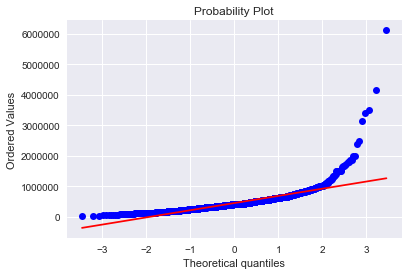

<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 1/1/2018 to 9/9/2016
Data columns (total 12 columns):
Loan Amount           2501 non-null float64
city_code             2501 non-null int16
zip_code              2501 non-null int16
loan_purpose_code     2501 non-null int64
Qualification FICO    2501 non-null int64
unit_type_code        2501 non-null int64
loan_type_code        2501 non-null int64
Fix_True              2501 non-null uint8
CLTV                  2501 non-null float64
LoanInMonth           2501 non-null int64
RATE                  2501 non-null float64
Home                  2501 non-null float64
dtypes: float64(4), int16(2), int64(5), uint8(1)
memory usage: 207.6+ KB


In [64]:
import pylab  #Plotting
import scipy.stats as stats # scintific calculation
stats.probplot(model_data['Loan Amount'], dist="norm", plot=pylab)
pylab.show()
###########################
type(model_data)
#type(model)
model_data.info()
X = np.array(model_data.drop(['Loan Amount'],1))
y = np.array(model_data['Loan Amount'])


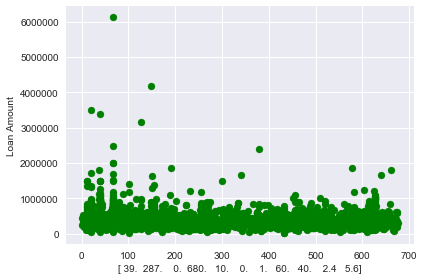

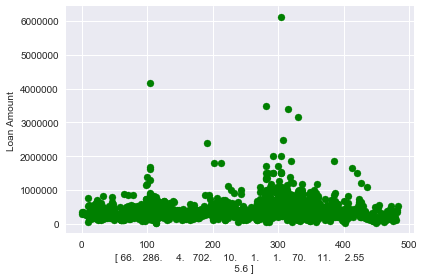

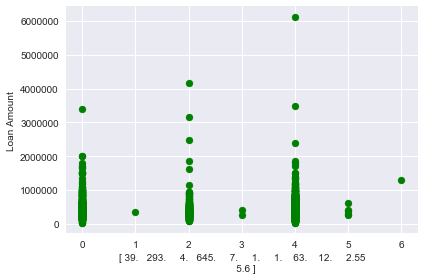

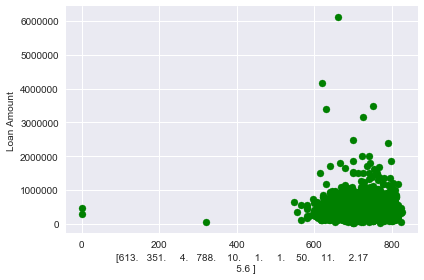

In [65]:
model_data.columns
for index, columns in enumerate(X[1:5]):
    plt.figure(figsize=(6, 4))
    plt.scatter(X[:, index], y, color='g')
    plt.ylabel('Loan Amount', size=10)
    plt.xlabel(columns, size=10)
    plt.tight_layout()

##### Print the scatter plot for each (Column 1-5) feature with respect to Loan Amount

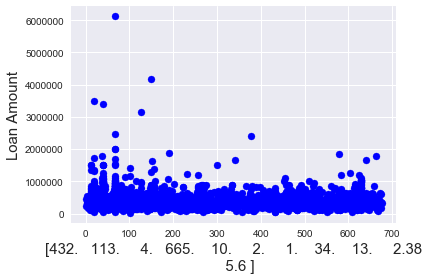

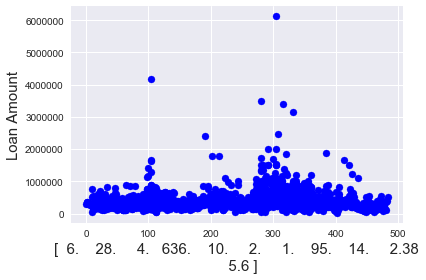

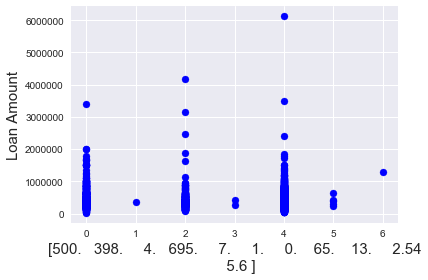

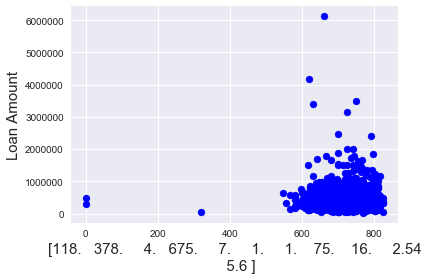

In [66]:
for index, columns in enumerate(X[6:10]):
    plt.figure(figsize=(6, 4))
    plt.scatter(X[:, index], y, color='b')
    plt.ylabel('Loan Amount', size=15)
    plt.xlabel(columns, size=15)
    plt.tight_layout()

##### Print the scatter plot for each (Column 6-10) feature with respect to Loan Amount

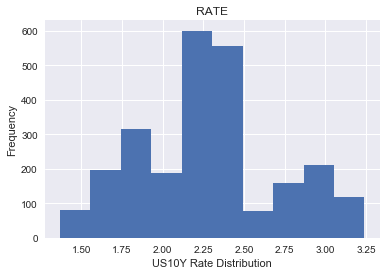

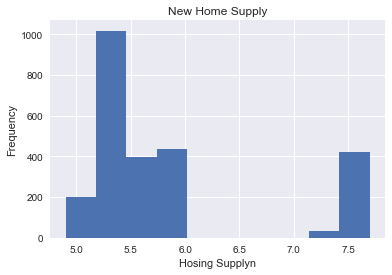

In [67]:
plt.hist(model_data['RATE'])
plt.title("RATE")
plt.xlabel("US10Y Rate Distribution")
plt.ylabel("Frequency")
plt.show()

plt.hist(model_data['Home'])
plt.title("New Home Supply")
plt.xlabel("Hosing Supplyn")
plt.ylabel("Frequency")
plt.show()


In [68]:
#This distribution is somewhat normal distribution

#The distribution is somewhat left skewed with a mean to the left


C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


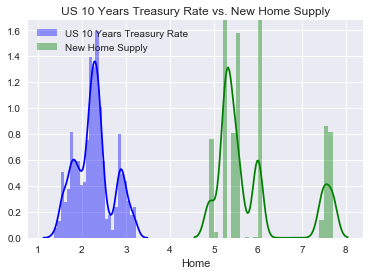

<Figure size 1080x864 with 0 Axes>

In [69]:
#Plot '10 Years T-RATE' and 'House Supply' on the same Axis
sns.distplot( model_data['RATE'] , color="blue", label="US 10 Years Treasury Rate")
sns.distplot( model_data['Home'] , color="green", label="New Home Supply")
plt.legend()
plt.title("US 10 Years Treasury Rate vs. New Home Supply")
plt.figure(figsize=(15, 12))
plt.show()

''' Home Supply goes up, RATE goes up '''

The distribution plot comparing US 10 Years Treasury Rate & New Home Supply shows that US 10Y RATE is normally distributed and New Home Supply is skewed to the right. Rate is the key component for the government to keep rising housing price in check. Once rate goes up, borrowers buying power will go down, that will keep housing price in check.


C:\Users\achow\Anaconda3\lib\site-packages\numpy\core\_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\achow\Anaconda3\lib\site-packages\numpy\core\_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\achow\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\achow\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


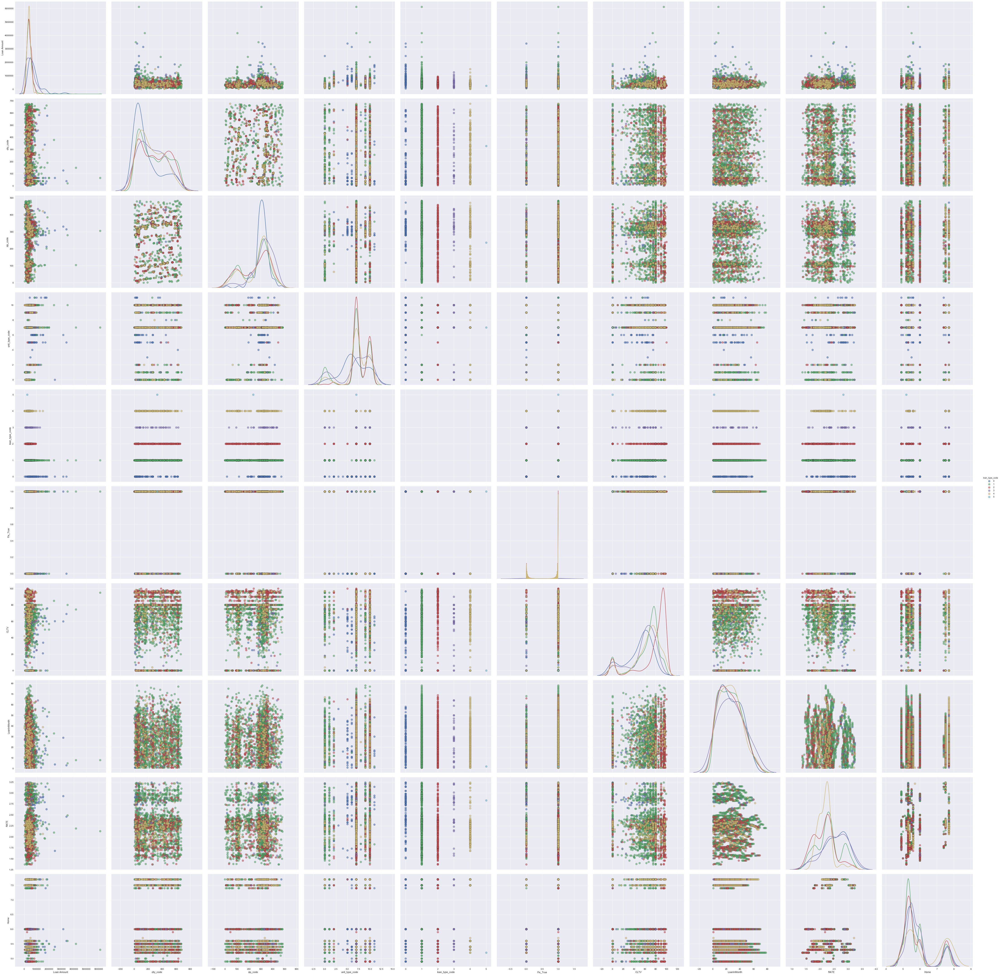

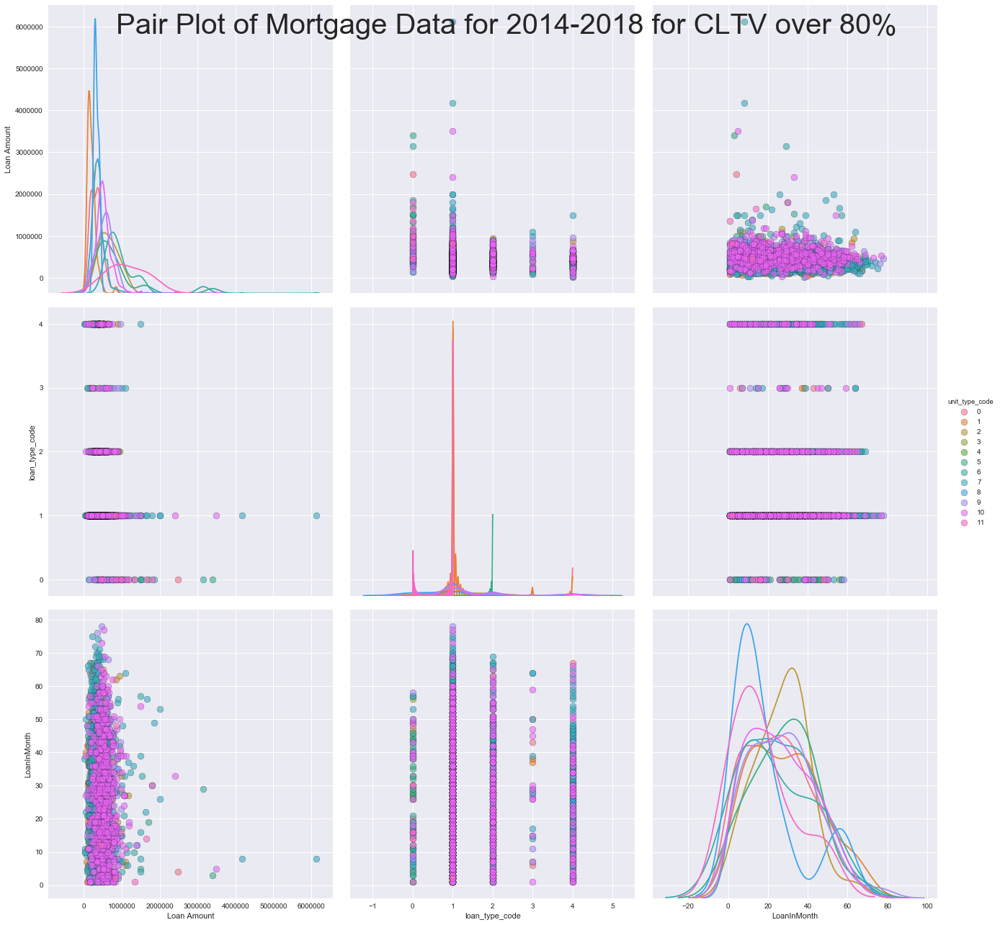

In [74]:
fit_data = model_data.drop(['loan_purpose_code', 'Qualification FICO' ],1)
sns.pairplot(fit_data, hue = 'loan_type_code', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 6)

# Plot colored by continent for years 2000-2007
sns.pairplot(fit_data[fit_data['CLTV'] >= 8],
             vars = ['Loan Amount', 'loan_type_code', 'LoanInMonth'],
             hue = 'unit_type_code', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 6);
# Title
plt.suptitle('Pair Plot of Mortgage Data for 2014-2018 for CLTV over 80%',
             size = 40);


C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\contour.py:960: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)
C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\contour.py:960: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)
C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\contour.py:960: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)
C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\contour.py:960: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)
C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\contour.py:960: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)
C:\Users\achow\Anaconda3\lib\site-packages\matplotlib\contour.py:960: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)


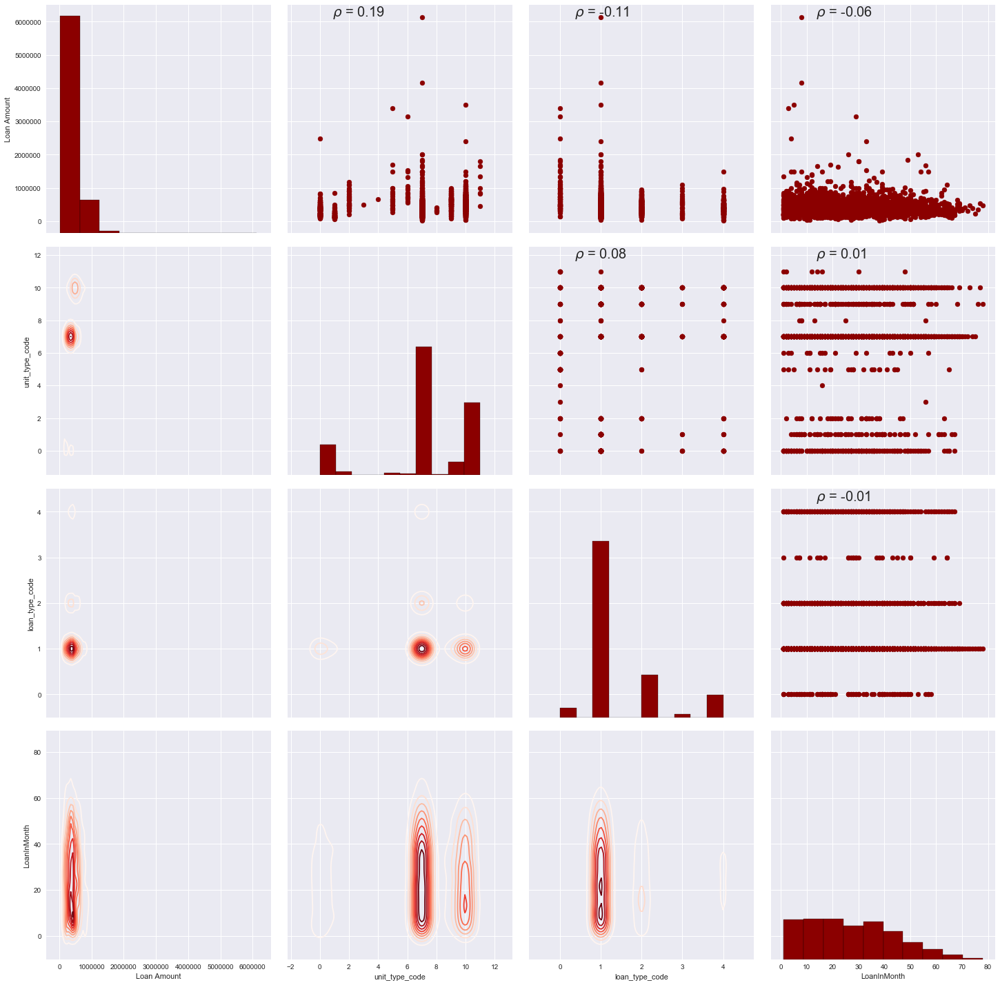

In [71]:
# Function to calculate correlation coefficient between two arrays
def corr(x, y, **kwargs):

    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))

    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (0.2, 0.95), size = 20, xycoords = ax.transAxes)

# Create a pair grid instance
grid = sns.PairGrid(data= fit_data[fit_data['CLTV'] > 8],
                    vars = ['Loan Amount', 'unit_type_code',
       'loan_type_code', 'LoanInMonth'], size = 5)

# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
grid = grid.map_diag(plt.hist, bins = 10, edgecolor =  'k', color = 'darkred');


# 6.3.1. Univariate Selection

Statistical tests can be used to select those features that have the strongest relationship with the output variable. The scikit-learn library provides the SelectKBest class that can be used with a suite of different statistical tests to select a specific number of features.

The example below uses the chi-squared (chi²) statistical test for non-negative features to select 10 of the best features from the Mobile Price Range Prediction Dataset.

In [75]:
model_data=model_data3.copy()
model_data['Qualification FICO']=model_data['Qualification FICO'].astype('int64')
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


Making sure Target Variable (Qualification FICO) is integer. In order to reduce the weight, we will be scalling.

In [76]:
#Scalling data
model_data['Loan Amount']=model_data['Loan Amount']/100000
model_data['Loan Amount']=model_data['Loan Amount'].astype('float64')
model_data['city_code']=model_data['city_code']/100
model_data['city_code']=model_data['city_code'].astype('float64')
model_data['zip_code']=model_data['zip_code']/100
model_data['zip_code']=model_data['zip_code'].astype('float64')
model_data['Qualification FICO']=model_data['Qualification FICO']/100
model_data['CLTV']=model_data['CLTV']/10
model_data['CLTV']=model_data['CLTV'].astype('float64')
model_data['LoanInMonth']=model_data['LoanInMonth']/10
model_data['LoanInMonth']=model_data['LoanInMonth'].astype('float64')
model_data['Qualification FICO']=model_data['Qualification FICO'].astype('float64')
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,4,7.77,7,0,0,6.0,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,0,6.80,10,0,1,6.0,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,4,7.02,10,1,1,7.0,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,4,6.45,7,1,1,6.3,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,4,7.88,10,1,1,5.0,1.1,2.17,5.6


<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 1/1/2018 to 9/9/2016
Data columns (total 12 columns):
Loan Amount           2501 non-null float64
city_code             2501 non-null float64
zip_code              2501 non-null float64
loan_purpose_code     2501 non-null int64
Qualification FICO    2501 non-null float64
unit_type_code        2501 non-null int64
loan_type_code        2501 non-null int64
Fix_True              2501 non-null uint8
CLTV                  2501 non-null float64
LoanInMonth           2501 non-null float64
RATE                  2501 non-null float64
Home                  2501 non-null float64
dtypes: float64(8), int64(3), uint8(1)
memory usage: 236.9+ KB
                 Specs      Score
0          Loan Amount  83.072449
1            city_code  29.972507
3    loan_purpose_code  23.663874
7             Fix_True   8.930081
2             zip_code   5.529163
8                 CLTV   5.020901
9          LoanInMonth   4.579280
6       loan_type_code   3.23544

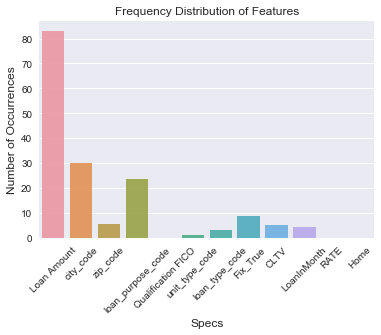

In [77]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

model_data.info()

X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])

#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k='all')
fit = bestfeatures.fit(X,y)

dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(model_data.columns)
#concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(11,'Score'))  #print 10 best features

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="darkgrid")
sns.barplot(featureScores['Specs'], featureScores['Score'], alpha=0.9)
plt.title('Frequency Distribution of Features')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Specs', fontsize=12)
plt.xticks(rotation=45)
plt.show()


# 6.3.2. Feature Importance

The feature importance of each feature of our dataset by using the feature importance property of the model. Feature importance gives us a score for each feature of our data, the higher the score more important or relevant is the feature towards your output variable. Feature importance is an inbuilt class that comes with Tree Based Classifiers, we will be using Extra Tree Classifier for extracting the top 10 features for the dataset.

[0.12628179 0.11898728 0.11821426 0.03390029 0.1277225  0.05288519
 0.06363727 0.0144152  0.12811489 0.12625031 0.08959101]


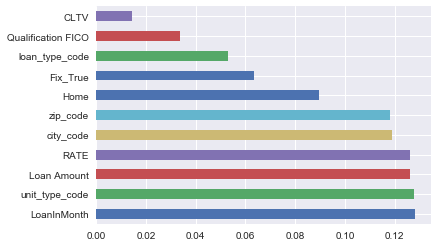

In [78]:
model_data['CLTV']=model_data['CLTV'].astype('int64')
import pandas as pd
import numpy as np

X = np.array(model_data.drop(['CLTV'],1))
#X = np.array(model_data.drop(['loan_purpose_code'],1))

y = np.array(model_data['CLTV'])    #target column
Z = model_data.drop(['loan_purpose_code'],1) #Max Col = 10

from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=Z.columns)
feat_importances.nlargest(11).plot(kind='barh')
plt.show()

# 6.3.3. Correlation Matrix with Heatmap
Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.



<class 'pandas.core.frame.DataFrame'>
Index: 2501 entries, 1/1/2018 to 9/9/2016
Data columns (total 10 columns):
Loan Amount       2501 non-null float64
city_code         2501 non-null float64
zip_code          2501 non-null float64
unit_type_code    2501 non-null int64
loan_type_code    2501 non-null int64
Fix_True          2501 non-null uint8
CLTV              2501 non-null int64
LoanInMonth       2501 non-null float64
RATE              2501 non-null float64
Home              2501 non-null float64
dtypes: float64(6), int64(3), uint8(1)
memory usage: 197.8+ KB
[[ 4.548  0.8    3.3    7.     0.     6.     4.     2.4    5.6  ]
 [ 9.6    0.39   2.87  10.     0.     6.     4.     2.4    5.6  ]
 [ 4.095  0.66   2.86  10.     1.     7.     1.1    2.55   5.6  ]
 [ 4.725  0.39   2.93   7.     1.     6.     1.2    2.55   5.6  ]
 [ 3.     6.13   3.51  10.     1.     5.     1.1    2.17   5.6  ]]
Target variable is based on the five input rows above. 
Fix Mortgage = 1 & ARM (Adjustable Rate Mortg

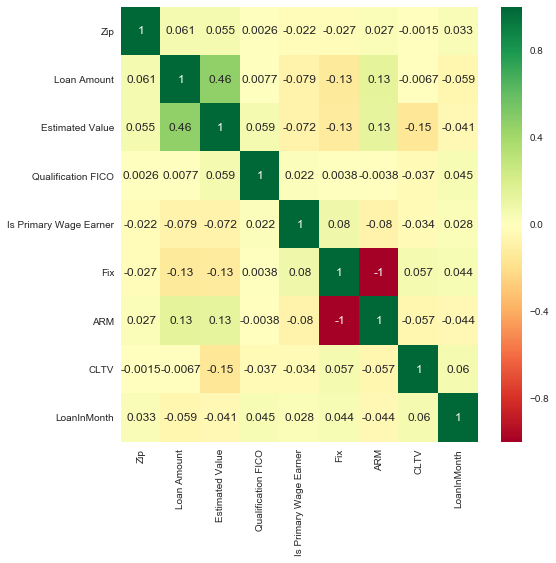

In [79]:
import pandas as pd
import numpy as np
import seaborn as sns
X = np.array(model_data.drop(['CLTV'],1))
y = np.array(model_data['CLTV'])    #target column

#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(8,8))
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

''' Let's Drop Fretures that are not important '''
fit_data = model_data.drop(['loan_purpose_code', 'Qualification FICO' ],1)
fit_data.info()
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])    #target column
print(X[:5,])  #print 1st 5 row of input
print('Target variable is based on the five input rows above. \nFix Mortgage = 1 & ARM (Adjustable Rate Mortgage) = 0 : \n',y[:5,])

# 6.4 PCA (Principal Component Analysis)
PCA use PCA to de-correlate these measurements, then plot the de-correlated points and measure their Pearson correlation. Compute Pearson correlation coefficient between two arrays.




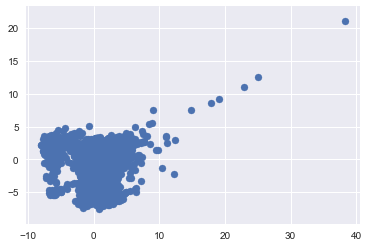

In [80]:
def pearson_r(x, y):
    # Compute correlation matrix: corr_mat
    corr_mat = np.corrcoef(x, y)
    # Return entry [0,1]
    return corr_mat[0, 1]

# Import PCA
from sklearn.decomposition import PCA
# Create PCA instance: model
model = PCA()
# Apply the fit_transform method of model to grains: pca_features
pca_features = model.fit_transform(model_data)
# Assign 0th column of pca_features: xs
xs = pca_features[:,0]
# Assign 1st column of pca_features: ys
ys = pca_features[:,1]
plt.scatter(xs, ys) # Scatter plot xs vs ys
plt.axis('equal')
plt.show()

# Variance of the PCA features
The dataset is 10-dimensional. But what is its intrinsic dimension? Make a plot of the variances of the PCA features to find out. As before, samples is a 2D array, where each row represents a fish. You'll need to standardize the features first. Tthe use of principal component analysis for dimensionality reduction, for visualization of high-dimensional data, for noise filtering, and for feature selection within high-dimensional data. Because of the versatility and interpretability of PCA, it has been shown to be effective in a wide variety of contexts and disciplines. Given any high-dimensional dataset, I tend to start with PCA in order to visualize the relationship between points ), to understand the main variance in the data and to understand the intrinsic dimensionality (by plotting the explained variance ratio).


In [81]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np


X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])
X.shape
# Create scaler: scaler
scaler = StandardScaler()

# Create a PCA instance: pca
pca = PCA()

# Create pipeline: pipeline
pipeline = make_pipeline(scaler, pca)

# Fit the pipeline to 'samples'
pipeline.fit(fit_data)
pca.n_components_

# Plot the explained variances
columns = ['Loan Amount', 'zip_code', 'loan_purpose_code', 'Qualification FICO', 'unit_type_code',
       'loan_type_code', 'Fix_True', 'CLTV', 'RATE', 'Home']


for x in ax.get_xticklabels(minor=True):
    columns.set_rotation(45)
    print(x)

ax.set_xticks(np.arange(len(fit_data.index)))
ax.set_xticklabels([case for case in fit_data.columns], rotation=30)

[Text(0,0,'Loan Amount'),
 Text(1,0,'city_code'),
 Text(2,0,'zip_code'),
 Text(3,0,'unit_type_code'),
 Text(4,0,'loan_type_code'),
 Text(5,0,'Fix_True'),
 Text(6,0,'CLTV'),
 Text(7,0,'LoanInMonth'),
 Text(8,0,'RATE'),
 Text(0,0,'Home')]

Now we want to know how many principal components we can choose for our new feature subspace? A useful measure is the so-called “explained variance ratio“. The explained variance ratio tells us how much information (variance) can be attributed to each of the principal components. We can plot bar graph between no. of features on X axis and variance ratio on Y axis

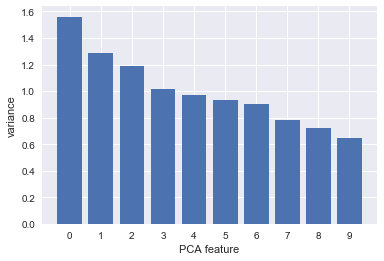

Text(0,0,'')
Text(0,0,'')
Text(0,0,'')
Text(0,0,'')
Text(0,0,'')
Text(0,0,'')
Text(0,0,'')
Text(0,0,'')
[4.45099908 2.78884446 2.59613754 7.07676929 1.41143543 6.18192723
 2.66541383 2.27612555 5.84162335]
[[ 6.74631158e-01 -1.42558887e-01  9.47144178e-02  7.15100575e-01
  -6.06926841e-03 -5.83982496e-02 -2.36003998e-02  1.04425183e-02
   9.84355581e-03]
 [ 6.24676971e-01 -3.39271890e-02 -3.63329138e-02 -5.46747569e-01
  -2.79653254e-02  5.54415690e-01 -1.46261205e-02  8.51674717e-04
   1.08518038e-03]
 [ 3.57335110e-01 -6.33451485e-02 -2.18323287e-02 -4.18052138e-01
  -6.39237795e-02 -8.25592495e-01 -7.95718612e-02  2.91204431e-02
   1.36334785e-02]
 [ 1.41995704e-01  9.86633070e-01  2.51691455e-02  5.62644035e-02
  -2.18679814e-02 -4.32461578e-02  1.18712611e-02 -9.30813486e-03
  -4.15073885e-03]
 [ 4.89655127e-02 -2.23000695e-02  5.89480870e-02 -3.00364922e-02
  -3.27211458e-02 -5.76526444e-02  9.93626306e-01 -1.40120500e-02
  -2.90507042e-02]
 [ 3.70608522e-02  1.14319728e-02 -9.90

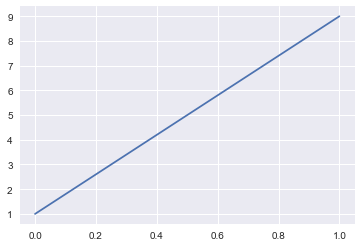

In [82]:
features = range(pca.n_components_)
feature_names = features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_)

plt.xlabel('PCA feature')
plt.ylabel('variance')
plt.xticks(feature_names)
plt.show()

plt.plot([1, 9])
ax = plt.gca()
labels = ax.get_xticklabels()
for label in labels:
    print(label)

pca.fit_transform(X)
print(pca.mean_)
print(pca.components_)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)
print(pca.n_components_)
print(pca.noise_variance_)

Text(0.5,1,'Correlation between Features and Target Variable in mortgage Dataset')

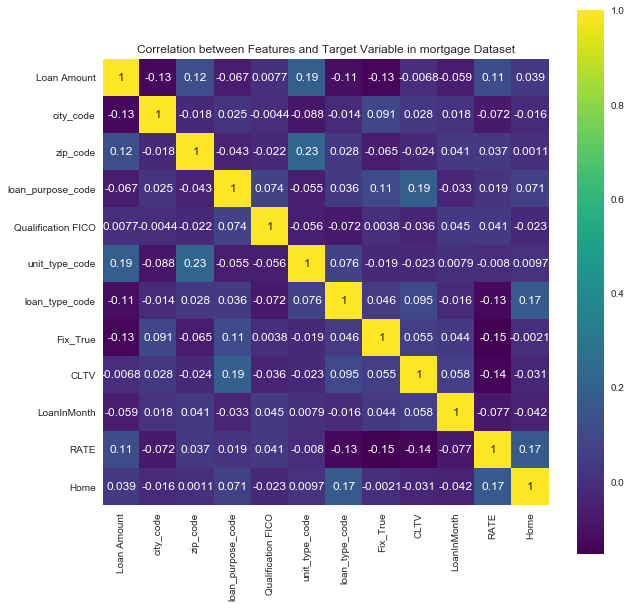

In [85]:
correlation = model_data.corr()
plt.figure(figsize=(10,10))
sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='viridis')
plt.title('Correlation between Features and Target Variable in mortgage Dataset')

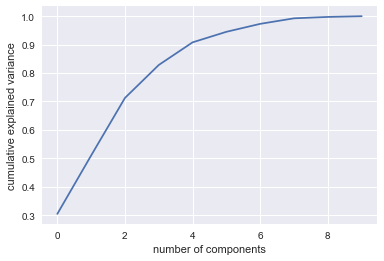

In [86]:
#Let us load the basic packages needed for the PCA analysis

pca = PCA().fit(fit_data)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');


# PCA as dimensionality reduction
Using PCA for dimensionality reduction involves zeroing out one or more of the smallest principal components, resulting in a lower-dimensional projection of the data that preserves the maximal data variance.

Here is an example of using PCA as a dimensionality reduction transform:


In [87]:
pca = PCA(n_components=6)
pca.fit(X)
X_pca = pca.transform(X)
print("original shape:   ", X.shape)
print("transformed shape:", X_pca.shape)


original shape:    (2501, 9)
transformed shape: (2501, 6)


The transformed data has been reduced to a 6 dimension. To understand the effect of this dimensionality reduction, we can perform the inverse transform of this reduced data and plot it along with the original data:

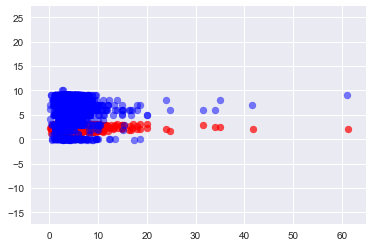

<Figure size 1440x720 with 0 Axes>

In [88]:
X_new = pca.inverse_transform(X_pca)
plt.scatter(X[:, 0], X[:, 7], alpha=0.7, c='red')
plt.scatter(X_new[:, 0], X_new[:, 5], alpha=0.5, c='blue')
plt.axis('equal');
plt.figure(figsize=(20,10))
plt.show()

The light points are the original data, while the dark points are the projected version. This makes clear what a PCA dimensionality reduction means: the information along the least important principal axis or axes is removed, leaving only the component(s) of the data with the highest variance. The fraction of variance that is cut out (proportional to the spread of points about the line formed in this figure) is roughly a measure of how much "information" is discarded in this reduction of dimensionality.

This reduced-dimension dataset is in some senses "good enough" to encode the most important relationships between the points: despite reducing the dimension of the data by 50%, the overall relationship between the data points are mostly preserved.

# 7 MODELING
In the Modeling stage we discuss the activities related to the model building part of our project. A selection of five modeling techniques is made that are applicable to our capstone project. From each of these five modeling techniques, a model is built with the feature set provided earlier, and the models are validated using repeated cross-validation.

7.1 SELECTION OF MODELING TECHNIQUES

For our modeling we use a combination of predictive techniques. Multiple techniques are selected and applied on the data. For the non-linear regression techniques, we use Support Vector Regression (SVR) and Neural Networks (NN). SVR has shown to obtain excellent performances in regression and time series applications. Neural Networks are a widely used method for time series data that generally gives mixed results.

Another technique we use is Classification and Decession Trees, which is a simple technique that is easy to visualize. Also two ensemble techniques are included, in order to improve the performance of the Classification and Regression Trees. These ensemble techniques are Gradient Boosting Machines (GBM) and Random Forests (RF). These techniques create a multitude of regression trees and select a combination of them in order to maximize the performance.

7.2 MODEL BUILDING

Using these five techniques (ARIMA, Linear Regression, Logistic Regression, SVM, SVR, Decision Tree, RF, and KNN) we can create five models. We use the list of features mentioned in section 6.3 as input for our models. A total of 12 features are included, the remaining features were excluded after performing feature selection. For each of the five models hyperparameters were tuned, using grid search. Hyperparameters are the model-specific parameters that are used for optimizing the model. They generally have to be tuned in order to optimize the model’s performance, and reduce the variance and bias of the model. By training the model with different values of the size and the decay, and evaluating its performance, we can select the hyperparameters that result in the best performing model in terms of predictive power.


# ARMA Model

Estimating an AR Model

We will estimate the AR(1) parameter, ϕ, of one of the Rate, Revenue, Loan_num, series that  generated in the earlier . Since the parameters are known for a series, it is a good way to understand the stimation routines before applying it to real data. For monthly_rate_data with a true ϕ of 0.9, we will print out the estimate of ϕ. In addition, we will also print out the entire output that is produced when you fit a time series, so we can get an idea of what other tests and summary statistics are available in statsmodels.

In [89]:
US10Y.index = pd.to_datetime(US10Y.index)

monthly_rate_data = US10Y['RATE'].resample(rule='M').last()


# Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA

# Fit an AR(1) model to the first simulated data
mod_rate = ARMA(np.asarray(monthly_rate_data), order=(1,0))
res_rate = mod_rate.fit()

# Print out summary information on the fit
print(res_rate.summary())

# Print out the estimate for the constant and for phi
print("\nWhen the true phi=0.9, the estimate of phi (and the constant) are:")
print(res_rate.params)

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                   51
Model:                     ARMA(1, 0)   Log Likelihood                  15.789
Method:                       css-mle   S.D. of innovations              0.175
Date:                Mon, 04 Feb 2019   AIC                            -25.579
Time:                        00:15:41   BIC                            -19.783
Sample:                             0   HQIC                           -23.364
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.3612      0.224     10.558      0.000       1.923       2.800
ar.L1.y        0.9057      0.053     16.978      0.000       0.801       1.010
                                    Roots           

Forecasting with an AR Model

In addition to estimating the parameters of a model, we can also do forecasting using statsmodels. The in-sample is a forecast of the next data point using the data up to that point, and the out-of-sample forecasts any number of data points in the future. These forecasts can be made using either the predict() method if we want the forecasts in the form of a series of data, or using the plot_predict() method we you want a plot of the forecasted data. We will supply the starting point for forecasting and the ending point, which can be any number of data points after the data set ends. For the simulated series Monthly Interest Rate with ϕ=0.9, we will plot in-sample and out-of-sample forecasts. 

Being able to forecast interest rates is of enormous importance, not only for bond investors but also for individuals like new homeowners who must decide between fixed and floating rate mortgages.

There is some mean reversion in interest rates over long horizons. In other words, when interest rates are high, they tend to drop and when they are low, they tend to rise over time. Currently they are below long-term rates, so they are expected to rise, but an AR model attempts to quantify how much they are expected to rise.


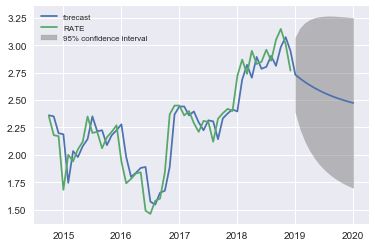

In [90]:
from statsmodels.tsa.arima_model import ARMA

# Forecast interest rates using an AR(1) model
mod_monthly_rate_data = ARMA(monthly_rate_data, order=(1,0))
res = mod_monthly_rate_data.fit()

# Plot the original series and the forecasted series
res.plot_predict(start=0, end='2020')
plt.legend(fontsize=8)
plt.show()

Since we have only used only FOUR years of Monthly Interest Rate Data, we can see the short term downward momentum on the interest rate

A daily move up or down in interest rates is unlikely to tell us anything about interest rates tomorrow, but a move in interest rates over a year can tell us something about where interest rates are going over the next year.
The DataFrame daily_data contains daily data of 10-year interest rates from 1962 to 2017

In [91]:
daily_data = pd.read_csv('c:/scripts/DGS10.csv', index_col='DATE')

#Data Cleaning
daily_data.replace('.', -99999, inplace=True)

daily_data= daily_data.replace(to_replace=[-99999], value=[np.nan])

daily_data = daily_data.dropna()

daily_data['DGS10']= daily_data['DGS10'].astype('float64')
daily_data['change_rates'] = daily_data.diff()
daily_data = daily_data.dropna()

#Convert index to datetime
daily_data.index = pd.to_datetime(daily_data.index)

annual_data = daily_data['DGS10'].resample(rule='A').last()
type(annual_data)
annual_data = annual_data.dropna()
# Repeat above for annual data
annual_data['diff_rates'] = annual_data.diff()
annual_data['diff_rates'] = annual_data['diff_rates'].dropna()

print(annual_data['diff_rates'])
#annual_data= annual_data.astype('float64')

# Compute and print the autocorrelation of daily changes
autocorrelation_daily = daily_data['change_rates'].autocorr()
print("The autocorrelation of daily interest rate changes is %4.2f" %(autocorrelation_daily))

# Compute and print the autocorrelation of annual changes
autocorrelation_annual = annual_data['diff_rates'].autocorr()
print("The autocorrelation of annual interest rate changes is %4.2f" %(autocorrelation_annual))



DATE
1963-12-31    0.29
1964-12-31    0.07
1965-12-31    0.44
1966-12-31   -0.01
1967-12-31    1.06
1968-12-31    0.46
1969-12-31    1.72
1970-12-31   -1.38
1971-12-31   -0.61
1972-12-31    0.52
1973-12-31    0.49
1974-12-31    0.50
1975-12-31    0.36
1976-12-31   -0.95
1977-12-31    0.97
1978-12-31    1.37
1979-12-31    1.18
1980-12-31    2.10
1981-12-31    1.55
1982-12-31   -3.62
1983-12-31    1.46
1984-12-31   -0.27
1985-12-31   -2.55
1986-12-31   -1.77
1987-12-31    1.60
1988-12-31    0.31
1989-12-31   -1.21
1990-12-31    0.15
1991-12-31   -1.37
1992-12-31   -0.01
1993-12-31   -0.87
1994-12-31    2.01
1995-12-31   -2.26
1996-12-31    0.85
1997-12-31   -0.68
1998-12-31   -1.10
1999-12-31    1.80
2000-12-31   -1.33
2001-12-31   -0.05
2002-12-31   -1.24
2003-12-31    0.44
2004-12-31   -0.03
2005-12-31    0.15
2006-12-31    0.32
2007-12-31   -0.67
2008-12-31   -1.79
2009-12-31    1.60
2010-12-31   -0.55
2011-12-31   -1.41
2012-12-31   -0.11
2013-12-31    1.26
2014-12-31   -0.87
2015-12

Notice how the daily autocorrelation is small (0.07) but the annual autocorrelation is large and negative (-0.22)

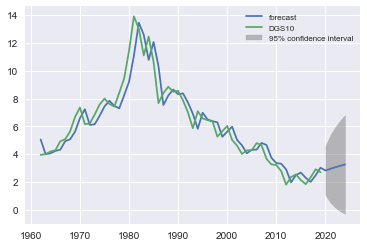

In [92]:
annual_rate=daily_data.resample('A').mean()
#type(annual_rate)
annual_rate_data=annual_rate['DGS10']

# Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA

# Forecast interest rates using an AR(1) model
mod_annual_rate = ARMA(annual_rate_data, order=(1,0))
res_annual_rate = mod_annual_rate.fit()

# Plot the original series and the forecasted series
res_annual_rate.plot_predict(start=0, end='2024')
plt.legend(fontsize=8)
plt.show()


Over long horizons, when interest rates go up, the economy tends to slow down, which consequently causes interest rates to fall, and vice versa.

According to an AR(1) model, 10-year interest rates are forecasted to rise from 2.16%, towards the end of 2017 to 3.35% in five years

# Forecast expected monthly closed loans

Our Mortgage DataSet contains data from Oct 2014 to December 2018. Let’s forecast Monthly Closed Loans and Monthly Revenue. We will forecast monthly_loan_num_data using an AR(1) model


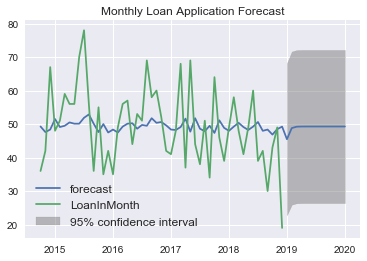

In [93]:
## Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
monthly_loan_num.resample('M').last()
monthly_loan_num_data= monthly_loan_num.resample('M').last()
monthly_loan_num_data=monthly_loan_num_data['LoanInMonth']
# Forecast monthly_loan_num_data using an AR(1) model
mod_monthly_loan_num_data = ARMA(monthly_loan_num_data, order=(1,0))
res_monthly_loan_num_data = mod_monthly_loan_num_data.fit()

# Plot the original series and the forecasted series
res_monthly_loan_num_data.plot_predict(start=0, end='2020')
plt.legend(fontsize=12)
plt.title('Monthly Loan Application Forecast')
plt.show()

'''Above we have plotted the original series and the forecasted series. With 95% confidence interval, Expected Loans per month will be around 50. Low end is 28 & High End is 70'''

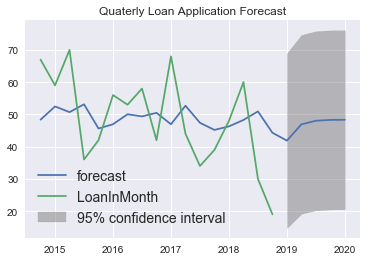

In [94]:
## Import the ARMA module from statsmodels
from statsmodels.tsa.arima_model import ARMA
monthly_loan_num.resample('Q').last()
Q_loan_num_data= monthly_loan_num.resample('Q').last()
Q_loan_num_data=Q_loan_num_data['LoanInMonth']
# Forecast quaterly_loan_num_data using an AR(1) model
mod_Q_loan_num_data = ARMA(Q_loan_num_data, order=(1,0))
res_mod_Q_loan_num_data = mod_Q_loan_num_data.fit()

# Plot the original series and the forecasted series
res_mod_Q_loan_num_data.plot_predict(start=0, end='2020')
plt.legend(fontsize=14)
plt.title('Quaterly Loan Application Forecast')
plt.show()

''Above we have plotted the original series and the forecasted series. With 95% confidence interval, Expected Loans per month will be around 47. Low end is 20 & High End is 75'''


# Forecast expected monthly revenue

Similarly, we may forecast expected monthly revenue and plot original series and the forecasted series


The AIC for an AR(1) is:  1715.9386048157016


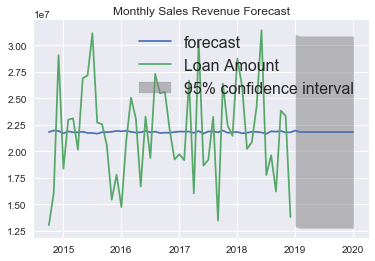

In [95]:
mod_monthly_loan_rev_data = ARMA(monthly_loan_rev_data, order=(1,0))

res_monthly_loan_rev_data = mod_monthly_loan_rev_data.fit()
print("The AIC for an AR(1) is: ", res_monthly_loan_rev_data.aic)
# Plot the original series and the forecasted series
res_monthly_loan_rev_data.plot_predict(start=0, end='2020')
plt.legend(fontsize=16)
plt.title('Monthly Sales Revenue Forecast')
plt.show()

With 95% confidence interval, Expected Revenue per month will be around 22M. Low end is 13M & High End is 32M

# Forecasting Quarterly Sales Revenue

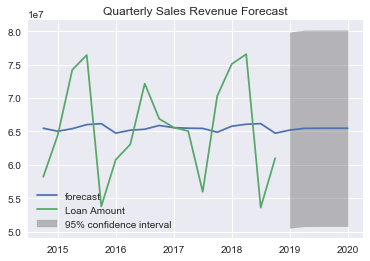

In [96]:
loan_patterns['date']= pd.DatetimeIndex(data['Created Date'])

loan_patterns = loan_patterns.set_index('date')
loan_patterns.index

quarterly_revenue_data = loan_patterns['Loan Amount'].resample(rule='Q').sum()

mod_quarterly_loan_rev_data = ARMA(quarterly_revenue_data, order=(1,0))

res_quarterly_loan_rev_data = mod_quarterly_loan_rev_data.fit()

# Plot the original series and the forecasted series
res_quarterly_loan_rev_data.plot_predict(start=0, end='2020')
plt.legend(fontsize=10)
plt.title('Quarterly Sales Revenue Forecast')
plt.show()

'''With 95% confidence interval, Expected Revenue per Quarters will be around 67M. Low end is 52M & High End is 80M'''

# Forecasting Annual Sales Revenue

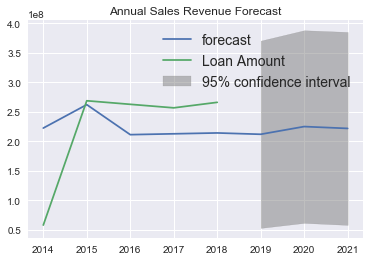

In [97]:
annual_revenue_data = loan_patterns['Loan Amount'].resample(rule='A').sum()

mod_annual_loan_rev_data = ARMA(annual_revenue_data, order=(1,0))

res_annual_loan_rev_data = mod_annual_loan_rev_data.fit()

# Plot the original series and the forecasted series
res_annual_loan_rev_data.plot_predict(start=0, end='2021')
plt.legend(fontsize=14)
plt.title('Annual Sales Revenue Forecast')
plt.show()

In the above graph, we have plotted the original series and the forecasted series. We are expecting little drop in annual mortgage revene. Our current annual revenue is $270M. By end of 2021, with 95% confidence interval, Expected Revenue per Years will be around 220M. Low end is 70M & High End is 360M. With more annual data, we should be able to do better annual revenue prediction.

# Linear regression

Purpose of linear regression: Given a dataset containing predictor variables X and outcome/response variable Y, linear regression can be used to:

Build a predictive model to predict future values, using new data X where Y is unknown.
Model the strength of the relationship between each independent variable X_i and Y
Many times, only a subset of independent variables X_i will have a linear relationship with Y
Need to figure out which X_i contributes most information to predict Y
It is in many cases, the first pass prediction algorithm for continuous outcomes.

Linear Regression is a method to model the relationship between a set of independent variables X (also knowns as explanatory variables, features, predictors) and a dependent variable Y. This method assumes the relationship between each predictor X is linearly related to the dependent variable Y. 

Independence means that the residuals are not correlated -- the residual from one prediction has no effect on the residual from another prediction. Correlated errors are common in time series analysis and spatial analyses.


In [98]:
from sklearn.model_selection import train_test_split # for train and test set split
from sklearn.model_selection import cross_val_score #Sklearn.model_seletion is used instead of sklearn.cross_validation to avoid
#warning

X = np.array(model_data.drop(['Loan Amount'],1))
y = np.array(model_data['Loan Amount'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("size of the training feature set is",X_train.shape)
print("size of the test feature set is",X_test.shape)
print("size of the training Target set is",y_train.shape)
print("size of the test Target set is",y_test.shape)


#Linear regression
from sklearn.linear_model import LinearRegression #import from sklearn
linear_reg= LinearRegression() # instantiated linreg
linear_reg.fit(X_train,y_train) #fit the model

#predict using X_test
predicted_train= linear_reg.predict(X_train)
predicted_test= linear_reg.predict(X_test)

from sklearn.metrics import mean_squared_error # import mse from sklearn
#calculate root mean squarred error
rmse_train=np.sqrt(mean_squared_error(y_train, predicted_train))
rmse_test=np.sqrt(mean_squared_error(y_test, predicted_test))

print('The train root mean squarred error is :', rmse_train)
print('The test root mean squarred error is :', rmse_test)

print('The Linear Regression coefficient parameters are :', linear_reg.coef_ )
print('The Linear Regression intercept value is :', linear_reg.intercept_)


size of the training feature set is (2000, 11)
size of the test feature set is (501, 11)
size of the training Target set is (2000,)
size of the test Target set is (501,)
The train root mean squarred error is : 2.345908703691074
The test root mean squarred error is : 3.963200847042714
The Linear Regression coefficient parameters are : [-0.11919389  0.20419526 -0.08932699  0.17949017  0.16819986 -0.3501712
 -0.68726163  0.04346237 -0.07163668  0.56560897  0.16290692]
The Linear Regression intercept value is : 0.7734251420145459



RMSE of the test data is closer to the training RMSE (and lower) if you have a well trained model. It will be higher if we have an overfitted model.


In [99]:
from sklearn import metrics # import metrics from sklearn

Rsquared=linear_reg.score(X_train,y_train) # to determine r square Goodness of fit

# how good the model fits the training data can be determined by R squared metric which is here 0.12
Rsquared
print('The R squared metric is :', Rsquared)


The R squared metric is : 0.12086787994354309


Out R^2 = 0.12

The R^2 in scikit learn is the coefficient of determination. It is 1 - residual sum of square / total sum of squares.

Since R^2 = 1 - RSS/TSS, the only case where RSS/TSS > 1 happens when our model is even worse than the worst model assumed (which is the absolute mean model).

here RSS = sum of squares of difference between actual values(yi) and predicted values(yi^) and TSS = sum of squares of difference between actual values (yi) and mean value (Before applying Regression). So you can imagine TSS representing the best(actual) model, and RSS being in between our best model and the worst absolute mean model in which case we'll get RSS/TSS < 1. If our model is even worse than the worst mean model then in that case RSS > TSS(Since difference between actual observation and mean value < difference predicted value and actual observation).

In [100]:
# K fold cross validation
# cross validation score
cv_score= cross_val_score(LinearRegression(),X,y,scoring='neg_mean_squared_error', cv=10) # k =10
print('cv_score is :', cv_score)

# mean squared error
print('cv_score is :', cv_score.mean())

# Root mean squared error
rmse_cv= np.sqrt(cv_score.mean() * -1)
print('The cross validation root mean squarred error is :', rmse_cv)



cv_score is : [-10.41761244  -2.87528686  -6.71334008  -6.83023816  -4.73823121
  -3.93130492 -11.82537791  -7.04069096  -3.51224496 -18.03312884]
cv_score is : -7.591745633330166
The cross validation root mean squarred error is : 2.755312256955673


With Linear regressor we are able to predict the model with RMSE:
The train RMSE = 2.349923482270037
The test RMSE  = 3.9655849638809144
    
R squared 0.12 and cross validation root mean squarred error is : 2.75

# Fitting Linear Regression using statsmodels
Statsmodels is a great Python library for a lot of basic and inferential statistics. It also provides basic regression functions using an R-like  syntax, so it's commonly used by statisticians.  The version of least-squares we will use  in statsmodels is called ordinary least-squares (OLS). There are many   other versions of least-squares such as partial least squares (PLS)  and weighted least squares (WLS).


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     30.62
Date:                Mon, 04 Feb 2019   Prob (F-statistic):           3.47e-08
Time:                        00:16:39   Log-Likelihood:                -6185.5
No. Observations:                2501   AIC:                         1.238e+04
Df Residuals:                    2499   BIC:                         1.239e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.7391      0.315      8.705      0.0

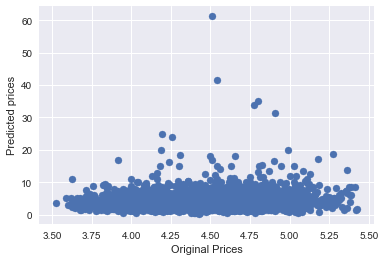

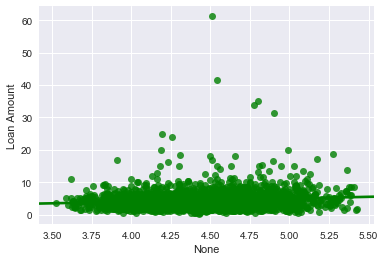

In [101]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# statsmodels works nicely with pandas dataframes
# The thing inside the "quotes" is called a formula, a bit on that below
m_rate = ols('y ~ RATE',model_data).fit()
print(m_rate.summary())

m_home = ols('y ~ Home',model_data).fit()
print(m_home.summary())

m_cltv = ols('y ~ CLTV',model_data).fit()
print(m_cltv.summary())

m_zip = ols('y ~ zip_code',model_data).fit()
print(m_zip.summary())

m_Fix_True = ols('y ~ Fix_True',model_data).fit()
print(m_Fix_True.summary())

m_loaninmonths = ols('y ~ LoanInMonth',model_data).fit()
print(m_loaninmonths.summary())

m_rcpi = ols('y ~ LoanInMonth + RATE + Home + CLTV ',model_data).fit()
print(m_rcpi.summary())

fdval = m_rcpi.fittedvalues

plt.scatter(fdval, y)

#plt.xlim(3,8)
#plt.ylim(0,1)
plt.ylabel('Predicted prices')
plt.xlabel('Original Prices')
plt.show()

sns.regplot(x=fdval, y="Loan Amount", data=model_data, fit_reg = True, color='g')
plt.show()

RATE R^2 = 0.12 (Same as before)
Home R^2 = 0.12 (Same as before)
CLTV R^2 = 0.00 (Same as before)

In [102]:
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,4,7.77,7,0,0,6,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,0,6.80,10,0,1,6,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,4,7.02,10,1,1,7,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,4,6.45,7,1,1,6,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,4,7.88,10,1,1,5,1.1,2.17,5.6


# Fitting Linear Regression using sklearn

Look inside lm object using dir(lm):

lm.predit()     lm.fit()

lm.score()      lm.coef_    lm.intercept_

Fit a linear model: The lm.fit() function estimates the coefficients the linear regression using least squares.

In [103]:
from sklearn.linear_model import LinearRegression

X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])
# This creates a LinearRegression object
lm = LinearRegression()

# Use all 13 predictors to fit linear regression model
lm.fit(X, y)
lm.coef_

lm.intercept_

# The mean squared error
print("Mean squared error (Fix_True Rate): %.2f" % np.mean((lm.predict(X) - y) ** 2))

X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
lm.fit(X, y)
lm.coef_

lm.intercept_

# The mean squared error
print("Mean squared error (loan_type_code): %.2f" % np.mean((lm.predict(X) - y) ** 2))

X = np.array(fit_data.drop(['Loan Amount'],1))
y = np.array(fit_data['Loan Amount'])
lm.fit(X, y)
lm.coef_

lm.intercept_

# The mean squared error
print("Mean squared error (Loan Amount): %.2f" % np.mean((lm.predict(X) - y) ** 2))

X = np.array(fit_data.drop(['unit_type_code'],1))
y = np.array(fit_data['unit_type_code'])
lm.fit(X, y)
lm.coef_

lm.intercept_

# The mean squared error
print("Mean squared error (unit_type_code): %.2f" % np.mean((lm.predict(X) - y) ** 2))

Mean squared error (Fix_True Rate): 0.09
Mean squared error (loan_type_code): 0.80
Mean squared error (Loan Amount): 7.55
Mean squared error (unit_type_code): 7.76


# Let's try Regression: with Scale

Here is the different types of regression we have used with StandardScaler and GridSearchCV:

LinearRegression

Lasso

Ridge

ElasticNet

SGDRegressor

In [104]:
import numpy as np
import pandas as pd
from pandas import DataFrame,Series
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, SGDRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.grid_search import GridSearchCV
from sklearn.cross_validation import train_test_split
#from sklearn.model_selection import train_test_split


def pretty_print_linear(coefs, names = None, sort = False):
    if names is None:
        names = ["X%s" % x for x in range(len(coefs))]
    lst = zip(coefs, names)
    if sort:
        lst = sorted(lst, key = lambda x:-np.abs(x[0]))
    return " + ".join("%s * %s" % (round(coef, 3), name) for coef, name in lst)

def scale_data(X):
    scaler = StandardScaler()
    X = scaler.fit_transform(X)
    return X

def split_data(X,Y):
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20, random_state=42)
    return X_train, X_test, Y_train, Y_test


def root_mean_square_error(y_pred,y_test):
    rmse_train = np.sqrt(np.dot(abs(y_pred-y_test),abs(y_pred-y_test))/len(y_test))
    return rmse_train



def plot_real_vs_predicted(y_pred,y_test):
    plt.plot(y_pred,y_test,'ro')
    plt.plot([0,50],[0,50], 'g-')
    plt.xlabel('predicted')
    plt.ylabel('real')
    plt.title('real_vs_predicted           .@achowdhu')
    plt.show()
    return plt


C:\Users\achow\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
C:\Users\achow\Anaconda3\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [105]:
np.set_printoptions(precision=2, linewidth=100, suppress=True, edgeitems=2)

#print('sample input data', X[10:15]) # Input variable
#print('sample output data', y[10:15] # Target Variable

X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])

X = scale_data(X)  #Scalling Input Data

X_train, X_test, y_train, y_test = split_data(X,y)

# Let's try Regular Linear Regression: 

           Loan Amount  city_code  zip_code  unit_type_code  loan_type_code  \
1/1/2018         4.548       0.80      3.30               7               0   
1/1/2018         9.600       0.39      2.87              10               0   
1/10/2018        4.095       0.66      2.86              10               1   
1/10/2018        4.725       0.39      2.93               7               1   
1/11/2016        3.000       6.13      3.51              10               1   

           Fix_True  CLTV  LoanInMonth  RATE  Home  
1/1/2018          0     6          4.0  2.40   5.6  
1/1/2018          1     6          4.0  2.40   5.6  
1/10/2018         1     7          1.1  2.55   5.6  
1/10/2018         1     6          1.2  2.55   5.6  
1/11/2016         1     5          1.1  2.17   5.6  
Linear model:  -0.034 * X7 + -0.034 * X0 + 0.025 * X1 + -0.015 * X2 + 0.01 * X6 + 0.009 * X8 + 0.008 * X5 + 0.002 * X3 + 0.0 * X4
Linear Regression - Root Mean Square Error:  0.2982900796002123


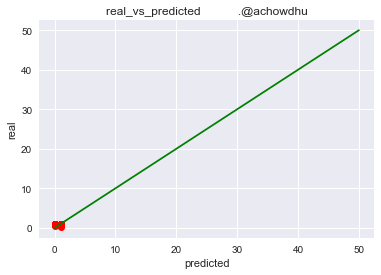

<module 'matplotlib.pyplot' from 'C:\\Users\\achow\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [106]:
print(fit_data.head())

# Create linear regression object
linreg = LinearRegression()

# Train the model using the training sets
linreg.fit(X_train,y_train)

print("Linear model: ", pretty_print_linear(linreg.coef_, sort = True))

# Predict the values using the model
y_lin_predict = linreg.predict(X_test)

# Print the root mean square error
print("Linear Regression - Root Mean Square Error: ", root_mean_square_error(y_lin_predict,y_test))
plot_real_vs_predicted(y_test,y_lin_predict)


# Let's try Lasso Regression:

Lasso model:  -0.0 * X0 + 0.0 * X1 + -0.0 * X2 + -0.0 * X3 + 0.0 * X4 + 0.0 * X5 + 0.0 * X6 + -0.0 * X7 + 0.0 * X8
Lasso model - Root Mean Square Error:  0.3075792710571243


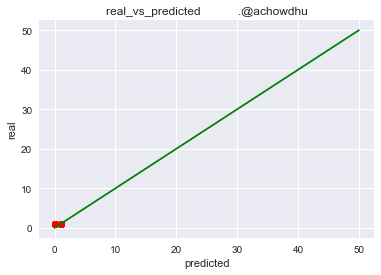

<module 'matplotlib.pyplot' from 'C:\\Users\\achow\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [107]:
# Create lasso regression object
lasso = Lasso(alpha=.3)

# Train the model using the training sets
lasso.fit(X_train, y_train)

print("Lasso model: ", pretty_print_linear(lasso.coef_, sort = True))

# Predict the values using the model
y_lasso_predict = lasso.predict(X_test)

# Print the root mean square error
print("Lasso model - Root Mean Square Error: ", root_mean_square_error(y_lasso_predict,y_test))
plot_real_vs_predicted(y_test,y_lasso_predict)


# Let's try Ridge Regression: 

Ridge model:  -0.034 * X7 + -0.034 * X0 + 0.025 * X1 + -0.015 * X2 + 0.01 * X6 + 0.009 * X8 + 0.008 * X5 + 0.002 * X3 + 0.0 * X4
Ridge Regression - Root Mean Square Error:  0.29829010039988163


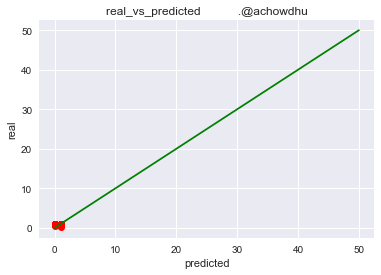

<module 'matplotlib.pyplot' from 'C:\\Users\\achow\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [108]:
ridge = Ridge(fit_intercept=True, alpha=.3)

# Train the model using the training sets
ridge.fit(X_train, y_train)

print("Ridge model: ", pretty_print_linear(ridge.coef_, sort = True))

# Predict the values using the model
y_ridge_predict = ridge.predict(X_test)

# Print the root mean square error
print("Ridge Regression - Root Mean Square Error: ", root_mean_square_error(y_ridge_predict,y_test))
plot_real_vs_predicted(y_test,y_ridge_predict)

# Now let's try to do regression via Elastic Net. 

Elastic Net model:  -0.0 * X0 + 0.0 * X1 + -0.0 * X2 + -0.0 * X3 + 0.0 * X4 + 0.0 * X5 + 0.0 * X6 + -0.0 * X7 + 0.0 * X8
Elastic Net - Root Mean Square Error:  0.3075792710571243


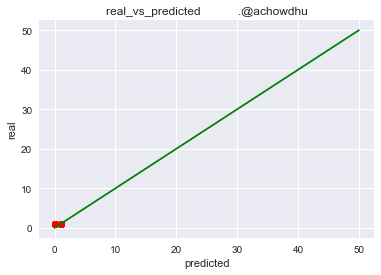

<module 'matplotlib.pyplot' from 'C:\\Users\\achow\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [109]:
elnet = ElasticNet(fit_intercept=True, alpha=.3)

# Train the model using the training sets
elnet.fit(X_train, y_train)

print("Elastic Net model: ", pretty_print_linear(elnet.coef_, sort = True))

# Predict the values using the model
y_elnet_predict = elnet.predict(X_test)

# Print the root mean square error
print("Elastic Net - Root Mean Square Error: ", root_mean_square_error(y_elnet_predict,y_test))
plot_real_vs_predicted(y_test,y_elnet_predict)


# Now let's try to do regression via Stochastic Gradient Descent.  


Stochastic Gradient Descent model:  -0.028 * X7 + -0.027 * X0 + 0.021 * X1 + -0.013 * X2 + 0.008 * X8 + 0.008 * X6 + 0.007 * X5 + 0.002 * X4 + -0.001 * X3
Stochastic Gradient Descent - Root Mean Square Error:  0.29880597293830624


C:\Users\achow\Anaconda3\lib\site-packages\sklearn\linear_model\stochastic_gradient.py:117: DeprecationWarning: n_iter parameter is deprecated in 0.19 and will be removed in 0.21. Use max_iter and tol instead.
  DeprecationWarning)


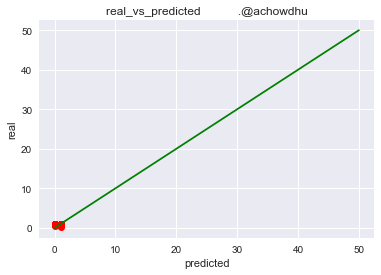

<module 'matplotlib.pyplot' from 'C:\\Users\\achow\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

In [110]:
sgdreg = SGDRegressor(penalty='l2', alpha=0.15, n_iter=200)

# Train the model using the training sets
sgdreg.fit(X_train, y_train)

print("Stochastic Gradient Descent model: ", pretty_print_linear(sgdreg.coef_, sort = True))

# Predict the values using the model
y_sgdreg_predict = sgdreg.predict(X_test)

# Print the root mean square error
print("Stochastic Gradient Descent - Root Mean Square Error: ", root_mean_square_error(y_sgdreg_predict,y_test))
plot_real_vs_predicted(y_test,y_sgdreg_predict)

#Regression Summary Report 

Linear Regression - Root Mean Square Error		:  0.298

Lasso model - Root Mean Square Error         		:  0.308

Ridge Regression - Root Mean Square Error		:  0.298

Elastic Net - Root Mean Square Error			:  0.308

Stochastic Gradient Descent - Root Mean Square Error	:  0.298
    
Linear Regression, Ridge Regression, Stochastic Gradient Descent all have - Root Mean Square Error:  0.298 
are performing best with low Root Mean Square Error    


##
Now we have a pandas DataFrame called model_data containing all the data we want to use to predict Mortgage Loan prices.
Let's create a variable called 'Loan Amount' which will contain the prices.

This information is contained in the target data.

In [111]:
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,4.548,0.80,3.30,4,7.77,7,0,0,6,4.0,2.40,5.6
1/1/2018,9.600,0.39,2.87,0,6.80,10,0,1,6,4.0,2.40,5.6
1/10/2018,4.095,0.66,2.86,4,7.02,10,1,1,7,1.1,2.55,5.6
1/10/2018,4.725,0.39,2.93,4,6.45,7,1,1,6,1.2,2.55,5.6
1/11/2016,3.000,6.13,3.51,4,7.88,10,1,1,5,1.1,2.17,5.6


In [112]:
model_data=model_data3.copy()
model_data.head()

,Loan Amount,city_code,zip_code,loan_purpose_code,Qualification FICO,unit_type_code,loan_type_code,Fix_True,CLTV,LoanInMonth,RATE,Home
1/1/2018,454800.0,80,330,4,777,7,0,0,60.0,40,2.40,5.6
1/1/2018,960000.0,39,287,0,680,10,0,1,60.0,40,2.40,5.6
1/10/2018,409500.0,66,286,4,702,10,1,1,70.0,11,2.55,5.6
1/10/2018,472500.0,39,293,4,645,7,1,1,63.0,12,2.55,5.6
1/11/2016,300000.0,613,351,4,788,10,1,1,50.0,11,2.17,5.6


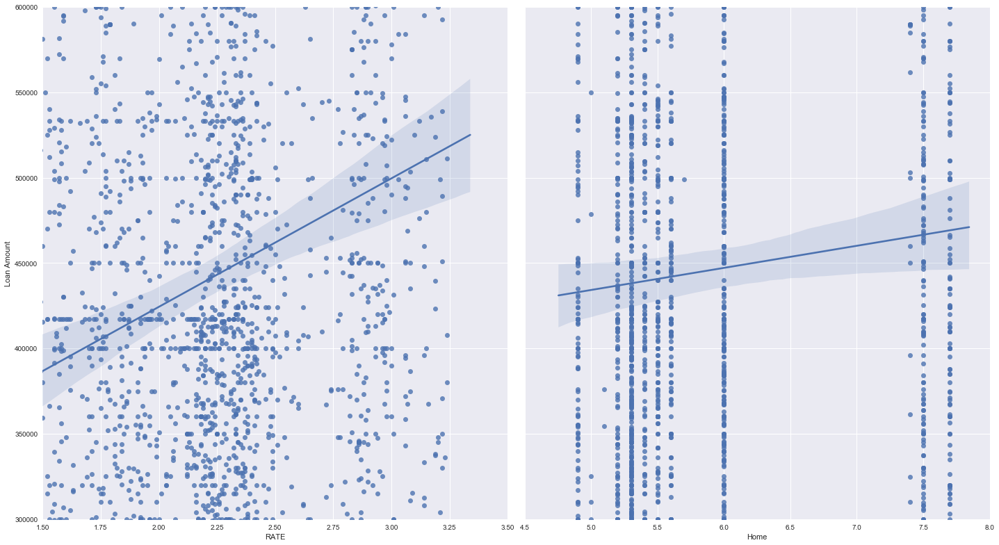

In [113]:
model_data.columns
import seaborn as sns
%matplotlib inline

g1=sns.pairplot(model_data, x_vars=['RATE', 'Home'], y_vars='Loan Amount', size=11, aspect=0.9, kind='reg')
g1.axes[0,1].set_ylim(300000,600000)
g1.axes[0,0].set_xlim(1.5,3.5)
g1.axes[0,1].set_xlim(4.5,8)
plt.show()

# US 10-Years Interest Rate goes up loan amount increases  

Home Supply increases, loan amount also increases slightly but eventually housing market will slow down 

Interest Rate Chage has bigger impact on Loan Amount compare to Home Supply

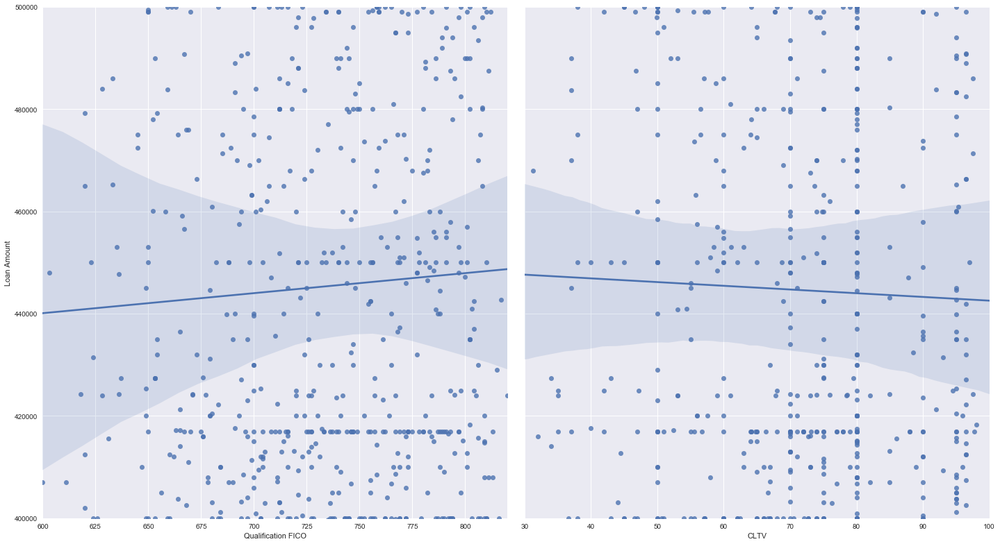

In [114]:
g=sns.pairplot(model_data, x_vars=['Qualification FICO', 'CLTV'], y_vars='Loan Amount', size=11, aspect=0.9, kind='reg')
g.axes[0,1].set_ylim(400000,500000)
g.axes[0,0].set_xlim(600, 820)
g.axes[0,1].set_xlim(30,100)
plt.show()

Majority of the FICO scores between 600 and 820 

Majority of the CLTV scores between 30% and 100%

## FICO goes up, Loan Amount goes up
## CLTV goes up, Loan Amount Goes down

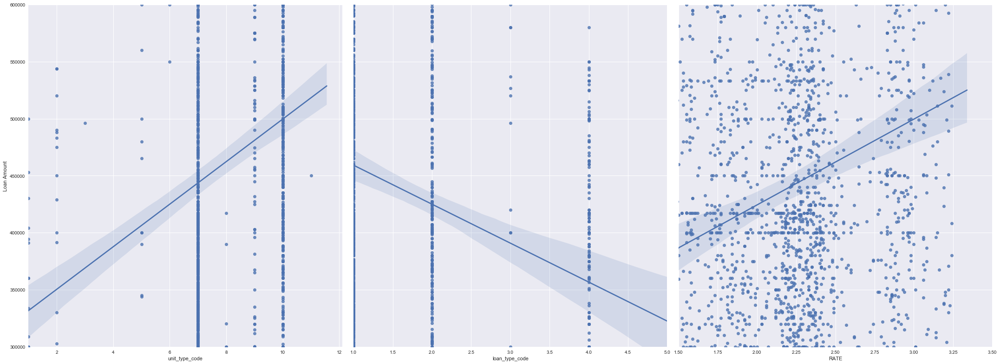

OneFamily      1276
TwoFamily       707
Condo           216
ThreeFamily     129
Coop             76
FourFamily       36
MixedUse         25
MultiFamily      20
Warehouse         8
PUD               6
Land              1
Industrial        1
Name: Unit Type, dtype: int64 
  7     1276
10     707
0      216
9      129
1       76
2       36
5       25
6       20
11       8
8        6
3        1
4        1
Name: unit_type_code, dtype: int64
Conventional    1736
FHA              418
Residential      215
Commercial       100
Other             31
VA                 1
Name: Loan Type, dtype: int64 
  1    1736
2     418
4     215
0     100
3      31
5       1
Name: loan_type_code, dtype: int64


In [115]:
g2=sns.pairplot(model_data, x_vars=['unit_type_code',
       'loan_type_code', 'RATE'], y_vars='Loan Amount', size=11, aspect=0.9, kind='reg')
g2.axes[0,1].set_ylim(300000,600000)
g2.axes[0,0].set_xlim(1.0,12.1)
g2.axes[0,1].set_xlim(1,5)
g2.axes[0,2].set_xlim(1.5,3.5)
plt.show()

print(data_lc['Unit Type'].value_counts(), '\n '  ,data_lc['unit_type_code'].value_counts())
print(data_lc['Loan Type'].value_counts(), '\n ', data_lc['loan_type_code'].value_counts())



As number of unit decreases ave Loan Amount also decreases

loan_type_code: Conventional is high volume but Slightly low average loan amount

ARM (Adjustable Rate Mortgage) has higher loan amount thn Fix_True Rate mortgage
Two Family (Code = 10) has higher Loan Amount that three Family (Code = 9)

Conventional Mortgage has Higher Loan Amount FHA
ARM has higher Loan Amount compare to Fix Rate Mortgage

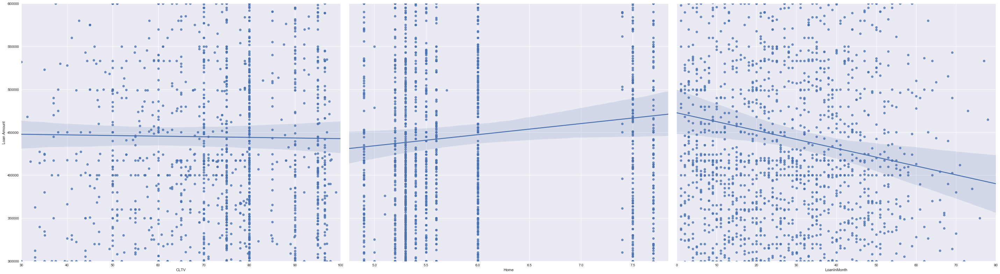

In [116]:
g3=sns.pairplot(model_data, x_vars=[ 'CLTV', 'Home', 'LoanInMonth'], y_vars='Loan Amount', size=11, aspect=1.2, kind='reg')
g3.axes[0,1].set_ylim(300000,600000)
g3.axes[0,0].set_xlim(30,100)
g2.axes[0,1].set_xlim(4.5,7.5)
g3.axes[0,2].set_xlim(0,80)
plt.show()

NYC NJ (zip_code between 7 & 11) seems to be closing more loans and generation more revenues for the Mortgage Bank. As number of loans per month inceases, loan amount decrease

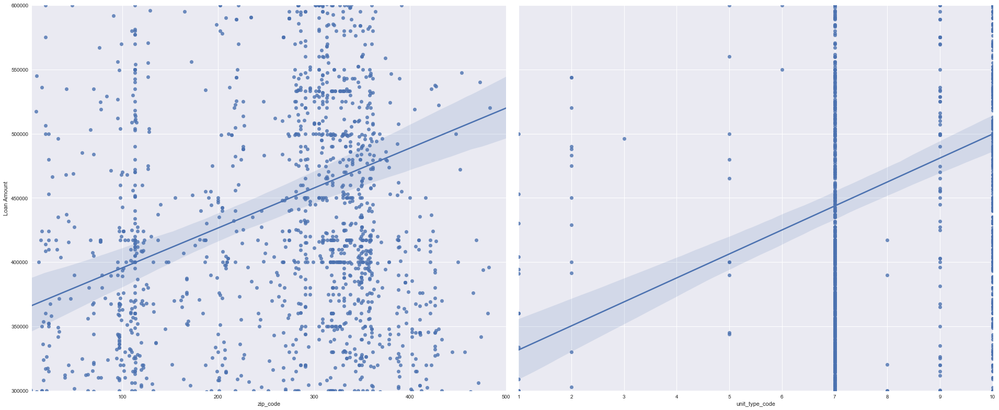

In [117]:
g4=sns.pairplot(model_data, x_vars=[ 'zip_code', 'unit_type_code'], y_vars='Loan Amount', size=11, aspect=1.2, kind='reg')
g4.axes[0,1].set_ylim(300000,600000)
g4.axes[0,0].set_xlim(6,500)
g4.axes[0,1].set_xlim(1,10)
plt.show()

NYC NJ (zip_code 1st digit starting with 7 & 11) seems to be closing more loans and generation more revenues for the Mortgage Bank. City shows similar results. Population density plays bigger role on Loan Amount. As number of loans per month increases, loan amount decreases

# Logistic Regression 

In [118]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import train_test_split
from sklearn import preprocessing, cross_validation, neighbors

X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
X_train, X_test, y_train, y_test_knn = cross_validation.train_test_split(X, y, test_size = 0.2)

# Create the DataFrame: numeric_data_only
numeric_data_only = model_data[0:10].fillna(-1000)
# Create training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=21)

# Instantiate the classifier: clf
clf = OneVsRestClassifier(LogisticRegression())

# Fit the classifier to the training data
clf.fit(X_train, y_train)

# Print the accuracy
print("Logistic Regression Accuracy: {}".format(clf.score(X_test, y_test)))

Logistic Regression Accuracy: 0.6866267465069861


Logistic Regression Model Accuracy for Loan Types: 69%

# Now Centering, Scaling and Logistic Regression and look at the model accuracy

In [119]:
# Import necessary packages
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from sklearn import datasets
from sklearn import linear_model
import numpy as np

# Load data
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
X.shape
y.shape
# Split the data into test and training sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train logistic regression model and print performance on the test set
lr = linear_model.LogisticRegression()

# fit the model
lr = lr.fit(X_train, y_train)
print('Logistic Regression score for training set: %f' % lr.score(X_train, y_train))
from sklearn.metrics import classification_report
y_true, y_pred = y_test, lr.predict(X_test)
print(classification_report(y_true, y_pred))


Logistic Regression score for training set: 0.705000
             precision    recall  f1-score   support

          0       0.33      0.10      0.15        20
          1       0.68      0.99      0.80       339
          2       0.50      0.01      0.02        96
          3       0.00      0.00      0.00         5
          4       0.00      0.00      0.00        41

avg / total       0.57      0.67      0.55       501



C:\Users\achow\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)



Out of the box, this logistic regression performs little better (70% model accuracy with or without scaling). Lets now scale our data and perform logistic regression:

In [120]:
from sklearn.preprocessing import scale
Xs = scale(X)
Xs_train, Xs_test, y_train, y_test = train_test_split(Xs, y, test_size=0.2)
lr_2 = lr.fit(Xs_train, y_train)
print('Scaled Logistic Regression score for test set: %f' % lr_2.score(Xs_test, y_test))
y_true, y_pred = y_test, lr_2.predict(Xs_test)
print(classification_report(y_true, y_pred))

Scaled Logistic Regression score for test set: 0.684631
             precision    recall  f1-score   support

          0       1.00      0.03      0.07        29
          1       0.69      1.00      0.81       342
          2       0.00      0.00      0.00        85
          3       0.00      0.00      0.00         9
          4       0.00      0.00      0.00        36

avg / total       0.53      0.68      0.56       501



C:\Users\achow\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


This is very interesting! The performance of logistic regression did not improve with data scaling. Why not, particularly when we saw that k-Nearest Neigbours performance improved substantially with scaling? The reason is that, if there predictor variables with large ranges that do not effect the target variable, a regression algorithm will make the corresponding coefficients ai small so that they do not effect predictions so much. K-nearest neighbours does not have such an inbuilt strategy and so we very much needed to scale the data.

# Scaling Synthesized Data
Scaling numerical data (that is, multiplying all instances of a variable by a constant in order to change that variable’s range) has two related purposes: i) if your measurements are in different currencies and, then, if we both scale our data, they end up being the same & ii) if two variables have vastly different ranges, the one with the larger range may dominate your predictive model, even though it may be less important to our target variable than the variable with the smaller range. What we saw is that this problem identified in ii) occurs with k-NN, which explicitly looks at how close data are to one another but not in logistic regression which, when being trained, will shrink the relevant coefficient to account for the lack of scaling. We can see was how the models performed before and after scaling.


Let’s now split into testing & training sets & plot both sets:

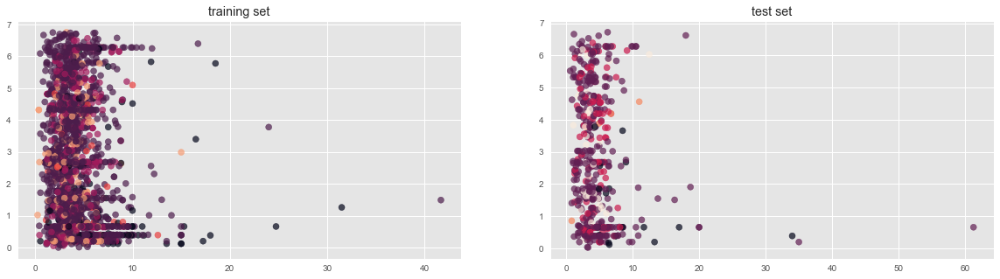

In [121]:

from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
plt.figure(figsize=(20,5));
plt.subplot(1, 2, 1 );
plt.title('training set')
plt.scatter(X_train[:,0] , X_train[:,1],  c = y_train, alpha = 0.7);
plt.subplot(1, 2, 2);
plt.scatter(X_test[:,0] , X_test[:,1],  c = y_test, alpha = 0.7);
plt.title('test set')
plt.show()


Looking good! Now let’s instantiate a k-Nearest Neighbors voting classifier & train it on our training set

In [122]:
from sklearn import neighbors, linear_model
knn = neighbors.KNeighborsClassifier()
knn_model = knn.fit(X_train, y_train)

print('k-NN score for test set: %f' % knn_model.score(X_test, y_test))
print('k-NN score for training set: %f' % knn_model.score(X_train, y_train))

from sklearn.metrics import classification_report
y_true, y_pred = y_test, knn_model.predict(X_test)
print(classification_report(y_true, y_pred))

k-NN score for test set: 0.700599
k-NN score for training set: 0.767500
             precision    recall  f1-score   support

          0       0.38      0.25      0.30        20
          1       0.72      0.94      0.81       339
          2       0.65      0.29      0.40        96
          3       0.00      0.00      0.00         5
          4       0.17      0.02      0.04        41

avg / total       0.64      0.70      0.64       501



C:\Users\achow\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


We can notice the improvement for KNN compare to Logistic Regression
Now with scaling KNN: I’ll now scale the predictor variables and then use k-NN again:

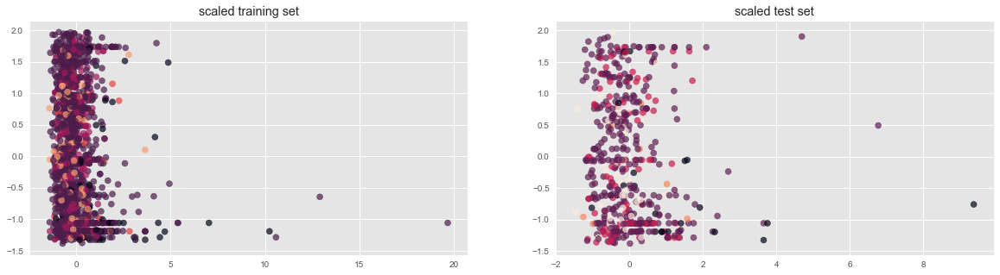

k-NN score for test set: 0.678643


In [123]:
from sklearn.preprocessing import scale
Xs = scale(X)
Xs_train, Xs_test, y_train, y_test = train_test_split(Xs, y, test_size=0.2)
plt.figure(figsize=(20,5));
plt.subplot(1, 2, 1 );
plt.scatter(Xs_train[:,0] , Xs_train[:,1],  c = y_train, alpha = 0.7);
plt.title('scaled training set')
plt.subplot(1, 2, 2);
plt.scatter(Xs_test[:,0] , Xs_test[:,1],  c = y_test, alpha = 0.7);
plt.title('scaled test set')
plt.show()
knn_model_s = knn.fit(Xs_train, y_train)
print('k-NN score for test set: %f' % knn_model_s.score(Xs_test, y_test))

k-NN score for test set: 0.72 or 72%

It doesn’t perform any better with scaling! This is most likely because both features were already around the same range. It really makes sense to scale when variables have widely varying ranges. To see this in action, we’re going to add another feature. Moreover, this feature will bear no relevance to the target variable: it will be mere noise.


# Adding Gaussian noise to the signal (KNN):
We add a third variable of Gaussian noise with mean 0 and variable standard deviation σ. We’ll call σ the strength of the noise and we’ll see that the stronger the noise, the worse the performance of k-Nearest Neighbours


k-NN score for test set: 0.305000


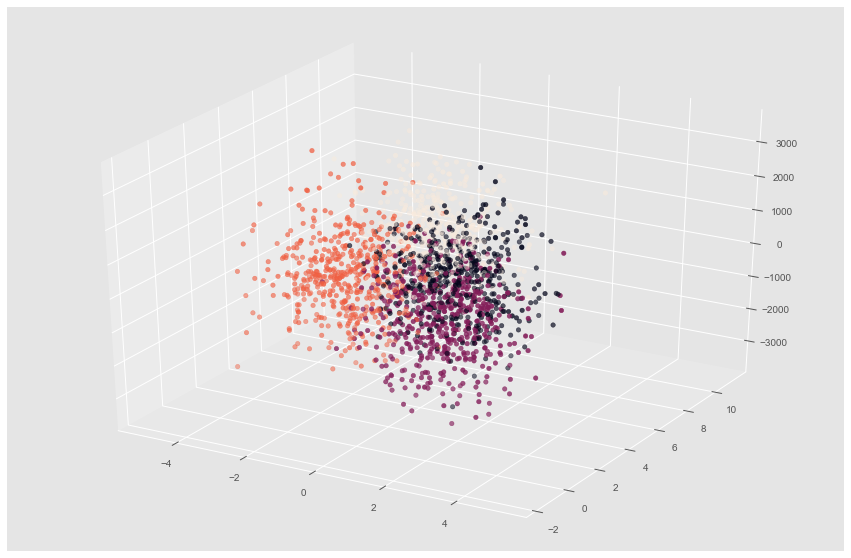

In [124]:
X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
# Generate some clustered data (blobs!)
import numpy as np
from sklearn.datasets.samples_generator import make_blobs
n_samples=2000
X, y = make_blobs(n_samples, centers=4, n_features=2,
                  random_state=0)

# Add noise column to predictor variables
ns = 10**(3) # Strength of noise term
newcol = np.transpose([ns*np.random.randn(n_samples)])
Xn = np.concatenate((X, newcol), axis = 1)

from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(15,10));
ax = fig.add_subplot(111, projection='3d' , alpha = 0.5);
ax.scatter(Xn[:,0], Xn[:,1], Xn[:,2], c = y);

Xn_train, Xn_test, y_train, y_test = train_test_split(Xn, y, test_size=0.2, random_state=42)
knn = neighbors.KNeighborsClassifier(n_neighbors=6)
knn_model = knn.fit(Xn_train, y_train)
print('k-NN score for test set: %f' % knn_model.score(Xn_test, y_test))


k-NN score for test set: 0..355 or 36%

This is a horrible model! How about we scale and check out performance?

In [125]:
Xns = scale(Xn)
s = int(.2*n_samples)
Xns_train = Xns[s:]
y_train = y[s:]
Xns_test = Xns[:s]
y_test = y[:s]
knn_models = knn.fit(Xns_train, y_train)
knn_accuracy = knn_models.score(Xns_test, y_test)
print('knn_accuracy for test set: ' , knn_accuracy)

knn_prediction = knn.predict(Xns[1515:1535])
print('KNN : - Output of Real Data : Conv=5, FHA=4, Res=3, Comm=2: ', (y[1515:1535]))
print('KNN : - Output of prediction: Conv=5, FHA=4, Res=3, Comm=2: ',knn_prediction)

knn_accuracy for test set:  0.9225
KNN : - Output of Real Data : Conv=5, FHA=4, Res=3, Comm=2:  [3 3 1 2 3 1 1 2 0 3 2 3 3 1 3 2 2 1 0 0]
KNN : - Output of prediction: Conv=5, FHA=4, Res=3, Comm=2:  [3 3 1 2 3 1 1 2 0 3 2 3 3 1 3 2 2 1 0 2]


With Scale and Synthesize the data we can see huge improvement on the model accuracy.. 36% to 93%
Let’s do same for Logistic Regression and check out the performance.


In [126]:
ns = 10**(3) # Strength of noise term
# Set sc = True if you want to scale your features
sc = False
#Import packages
import numpy as np
from sklearn.cross_validation import train_test_split
from sklearn import neighbors, linear_model
from sklearn.preprocessing import scale
from sklearn.datasets.samples_generator import make_blobs
    
#Generate some data
n_samples=2000
X, y = make_blobs(n_samples, centers=4, n_features=2, random_state=0)
# Add noise column to predictor variables
newcol = np.transpose([ns*np.random.randn(n_samples)])
Xn = np.concatenate((X, newcol), axis = 1)

#Scale if desired
if sc == True:
    Xn = scale(Xn)
    
#Train model and test after splitting
Xn_train, Xn_test, y_train, y_test = train_test_split(Xn, y, test_size=0.2, random_state=42)
lr = linear_model.LogisticRegression()
lr_model = lr.fit(Xn_train, y_train)
print('logistic regression score for test set: %f' % lr_model.score(Xn_test, y_test))

logistic regression score for test set: 0.930000


logistic regression score for test set has improved from 66% to 0.93 or 93%

We can see big improvement. We have seen the essential place in the data scientific pipeline by preprocessing, in its scaling and centering incarnation, and we have done so to promote a holistic approach to minimize the challenges of machine learning.

To conclude, we have seen the essential place occupied in the data scientific pipeline by preprocessing, in its scaling and centering incarnation, and we have done so to promote a holistic approach to the challenges of machine learning.

# Random Forests (RF) 

Random forests is a supervised learning algorithm. It can be used both for classification and regression. It is also the most flexible and easy to use algorithm. A forest is comprised of trees. It is said that the more trees it has, the more robust a forest is. Random forests creates decision trees on randomly selected data samples, gets prediction from each tree and selects the best solution by means of voting. It also provides a pretty good indicator of the feature importance. Random forests has a variety of applications, such as recommendation engines, image classification and feature selection. It can be used to classify loyal loan applicants, identify fraudulent activity and predict diseases. 

•	Random forests is considered as a highly accurate and robust method because of the number of decision trees participating in the process.

•	It does not suffer from the over fitting problem. The main reason is that it takes the average of all the predictions, which cancels out the biases.

•	The algorithm can be used in both classification and regression problems.

•	Random forests can also handle missing values


In [128]:
import pandas as pd
import numpy as np
from sklearn import preprocessing, cross_validation, neighbors, svm 
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])
X_train, X_test, y_train, y_test_rfc = cross_validation.train_test_split(X, y, test_size = 0.2)

rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True) 
rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)
print('Unscalled: Random Forest Classifier Accuracy : ', rfc_accuracy)

X = np.array(fit_data.drop(['loan_type_code'],1))
y = np.array(fit_data['loan_type_code'])

from sklearn.preprocessing import scale
X_scaled = scale(X)

X_train, X_test, y_train, y_test_rfc = cross_validation.train_test_split(X, y, test_size = 0.2)
rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True) 
rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)
print('Scalled: Random Forest Classifier Accuracy   : ', rfc_accuracy)

#Look for the confussion Matrix
from sklearn.metrics import confusion_matrix
#confusion_matrix?

rfc.predict(X_test)
y_pred_rfc = rfc.predict(X_test)
y_pred_rfc_out = rfc.predict(X[975:995,])
print('RFC Confussion Matrix: ')
print(confusion_matrix(y_test_rfc, y_pred_rfc, labels=None, sample_weight=None))

print('KNeighborsClassifier Accuracy : ', rfc_accuracy) 
print('RandomForestClassifier :Input Real Data : Conv=5, FHA=4, Res=3, Comm=2: ', X[975:995,]) 
print('RandomForestClassifier :Output of X[975:995]:Conv=5, FHA=4, Res=3, Comm=0:' , y[975:995])
print('RandomForestClassifier :Output of prediction: Conv=5, FHA=4, Res=3, Comm=:', y_pred_rfc_out)
print('RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:', y_pred_rfc)


Unscalled: Random Forest Classifier Accuracy :  0.7664670658682635
Scalled: Random Forest Classifier Accuracy   :  0.782435129740519
RFC Confussion Matrix: 
[[ 10  13   0   0   1]
 [  2 334   9   0   2]
 [  0  42  37   0   0]
 [  0   8   0   1   0]
 [  0  32   0   0  10]]
KNeighborsClassifier Accuracy :  0.782435129740519
RandomForestClassifier :Input Real Data : Conv=5, FHA=4, Res=3, Comm=2:  [[ 3.    1.55  3.17  7.    1.    6.    4.5   1.96  5.4 ]
 [ 4.47  5.83  3.37 10.    1.    8.    4.6   1.71  5.4 ]
 [ 1.64  3.36  4.32  7.    1.    9.    4.    1.71  5.4 ]
 [ 3.25  2.29  3.79  7.    0.    7.    4.6   2.03  5.4 ]
 [ 4.05  1.55  3.18  7.    1.    6.    4.7   2.03  5.4 ]
 [ 2.27  3.18  3.83  7.    1.    6.    4.8   2.03  5.4 ]
 [ 6.25  2.84  3.58  7.    1.    7.    4.7   1.76  5.4 ]
 [ 1.84  1.27  3.31  1.    1.    7.    4.8   1.76  5.4 ]
 [ 3.46  5.75  0.34  7.    1.    7.    4.7   2.86  5.4 ]
 [ 1.86  4.54  3.55  1.    1.    8.    4.9   2.86  5.4 ]
 [ 9.4   0.4   3.09 10.    1.    

Unscalled: Random Forest Classifier Accuracy :  77%
        
Scalled: Random Forest Classifier Accuracy   :  78%
        
Both unscalled and scalled for Random Forest Model accuray is almost close


# Let’s analyze Interest Rate types using Random Forest Classifier. 
We have achieved greater accuracy compare to Loan Types. We have Fixed Rate mortgage where Fix_True = 1 & Fix_True = 0 for ARM (Adjustable Rate Mortgage)

In [131]:
import pandas as pd
import numpy as np
from sklearn import preprocessing, cross_validation, neighbors, svm
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])

from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)

X_train, X_test, y_train, y_test_rfc = cross_validation.train_test_split(X, y, test_size = 0.2)

rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True)

rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)

print('Random Forest Classifier Accuracy : ', rfc_accuracy)

# Look for the confussion Matrix
from sklearn.metrics import confusion_matrix
#confusion_matrix? # Hit enter

rfc.predict(X_test)
y_pred_rfc = rfc.predict(X_test)
y_pred_rfc_out = rfc.predict(X[975:995,])
print('RFC Confussion Matrix: ')
print(confusion_matrix(y_test_rfc, y_pred_rfc, labels=None, sample_weight=None))

print('RandomForestClassifier Accuracy : ', rfc_accuracy)


print('RandomForestClassifier : - Input of Real Data : Fix_True =1 & ARM =0: ', X[975:995,])

print('RandomForestClassifier : - Output of X[975:995]: Fix_True =1 & ARM =0:' , y[975:995])
print('RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:', y_pred_rfc_out)

print('\n############ Prediction  ######################')

print('RandomForestClassifier : - Output of prediction: Fix_True =1 & ARM =0:', y_pred_rfc)


Random Forest Classifier Accuracy :  0.908183632734531
RFC Confussion Matrix: 
[[ 10  40]
 [  6 445]]
RandomForestClassifier Accuracy :  0.908183632734531
RandomForestClassifier : - Input of Real Data : Fix_True =1 & ARM =0:  [[ 300000.       155.       317.         4.       753.         7.         4.        62.
       45.         1.96       5.4 ]
 [ 447000.       583.       337.         2.       708.        10.         1.        87.82
       46.         1.71       5.4 ]
 [ 164326.25     336.       432.         4.       616.         7.         2.        95.
       40.         1.71       5.4 ]
 [ 325000.       229.       379.         2.       738.         7.         4.        75.
       46.         2.03       5.4 ]
 [ 405000.       155.       318.         2.       798.         7.         4.        66.61
       47.         2.03       5.4 ]
 [ 227500.       318.       383.         0.       767.         7.         4.        61.
       48.         2.03       5.4 ]
 [ 625000.       284.     

Random Forest Classifier Accuracy for Fix or ARM is :  0.91 or 91%

# Using Random Forest finding Important Features in Scikit-learn
Here, we are finding important features or selecting features in the Mortgage Loan dataset. In scikit-learn, we can perform this task in the following steps:

•	First, we need to create a random forests model.

•	Second, use the feature importance variable to see feature importance scores.

•	Third, visualize these scores using the seaborn library.'''


In [133]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing, cross_validation, neighbors, svm

X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])

from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)

X_train, X_test, y_train, y_test_rfc = cross_validation.train_test_split(X, y, test_size = 0.2)

rfc = RandomForestClassifier(n_jobs=-1,max_features= 'auto' ,n_estimators=200, oob_score = True)

rfc.fit(X_train, y_train)
rfc_accuracy = rfc.score(X_test, y_test_rfc)

print('Random Forest Classifier Accuracy : ', rfc_accuracy)


#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)


import pandas as pd
#col_names = (fit_data.columns)

X = (model_data.drop(['Qualification FICO'],1))

feature_cols = fit_data.columns

model_data.columns
feature_names = feature_cols
feature_imp = pd.Series(clf.feature_importances_,index=X.columns).sort_values(ascending=False)
feature_imp

Random Forest Classifier Accuracy :  0.8982035928143712


RATE                 0.148499
Loan Amount          0.126198
unit_type_code       0.111566
zip_code             0.107917
LoanInMonth          0.104603
city_code            0.101437
CLTV                 0.083989
Fix_True             0.082615
Home                 0.061437
loan_type_code       0.038747
loan_purpose_code    0.032993
dtype: float64

We can also visualize the feature importance. Visualizations are easy to understand and interpretable. For visualization, we have used a combination of matplotlib and seaborn.

No handles with labels found to put in legend.


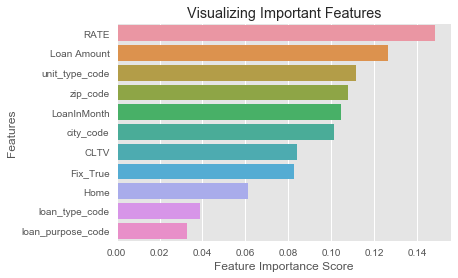

In [134]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
# Creating a bar plot
sns.barplot(x=feature_imp, y=feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

Higher the value, greater the feature importance

# Support Vector Regression (SVR)
SUPPORT VECTOR REGRESSION. Those who are in Machine Learning or Data Science are quite familiar with the term SVM or Support Vector Machine. But SVR is a bit different from SVM. As the name suggest the SVR is an regression algorithm, so we can use SVR for working with continuous Values instead of Classification which is SVM.


In [135]:
X = np.array(model_data.drop(['Loan Amount'],1))
y = np.array(model_data['Loan Amount'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# We want to use svm now
from sklearn import preprocessing, cross_validation, svm
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from matplotlib import style

clf = svm.SVR()
clf.fit(X_train, y_train)
accuracy = clf.score(X_test, y_test)
print('SVM accuracy: ', accuracy)


SVM accuracy:  -0.025991264219975774


SVM-SVR accuracy:  -0.026 which is unacceptable for our Mortgage Loan Data Sets

# Support Vector Machine (SVM)

A Support Vector Machine (SVM) is a discriminative classifier formally defined by a separating hyperplane. In other words, given labeled training data (supervised learning), the algorithm outputs an optimal hyperplane which categorizes new examples. In two dimensional space this hyperplane is a line dividing a plane in two parts where in each class lay in either side.


In [136]:
from sklearn import preprocessing, cross_validation, neighbors, svm

X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#Define SVM support vector classifier
svmc = svm.SVC(kernel='rbf', C=10, gamma=1)
svmc.fit(X_train, y_train)
svm_accuracy = svmc.score(X_test, y_test)

print('Support Vector Classifier Accuracy : ', svm_accuracy)

# Look for the confussion Matrix
from sklearn.metrics import confusion_matrix
#confusion_matrix? # Hit enter

svmc.predict(X_test)
y_pred_svm = svmc.predict(X_test)
print('SVC Confussion Matrix: ')
print(confusion_matrix(y_test, y_pred, labels=None, sample_weight=None))

from sklearn.cross_validation import cross_val_score
svm_scores = cross_val_score(svmc, X, y, cv=7, scoring='accuracy')
print('SVM: cross_val_score accuracy : ', svm_scores)


Support Vector Classifier Accuracy :  0.8962075848303394
SVC Confussion Matrix: 
[[  6  47   0   0]
 [  7 392  43   6]
 [  0   0   0   0]
 [  0   0   0   0]]
SVM: cross_val_score accuracy :  [0.9 0.9 0.9 0.9 0.9 0.9 0.9]


Support Vector Classifier Accuracy :  0.896 or 90%


# k-Nearest Neighbors (KNN)

k-Nearest Neighbors: FIT
    
Having explored the Congressional mortgage records dataset, we have build our classifier. Here, we will fit a k-Nearest Neighbors classifier to the mortgage dataset. The features need to be in an array where each column is a feature and each row a different observation or data point. The target needs to be a single column with the same number of observations as the feature data. Notice we named the feature array X and response variable y: This is in accordance with the common scikit-learn practice.
We need create an instance of a k-NN classifier with 6 neighbors (by specifying the n_neighbors parameter) and then fit it to the data. 


# k-Nearest Neighbors: Predict
Having fit a k-NN classifier, we can use it to predict the label of a new data point. However, there is no unlabeled data available since all of it was used to fit the model! We will use your classifier to predict the label for this new data point, as well as on the training data X that the model has already seen.


In [141]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import preprocessing, cross_validation, neighbors
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split # for train and test set split
from sklearn.model_selection import cross_val_score

X = np.array(model_data.drop(['Fix_True'],1))
y = np.array(model_data['Fix_True'])
X_train, X_test, y_train, y_test_knn = cross_validation.train_test_split(X, y, test_size = 0.2)

from sklearn.neighbors import KNeighborsClassifier
print("size of the training feature set is",X_train.shape)
print("size of the test feature set is",X_test.shape)
print("size of the training Target set is",y_train.shape)
print("size of the test Target set is",y_test.shape)

# Import scale
from sklearn.preprocessing import scale

# Scale the features: X_scaled
X_scaled = scale(X)

# Print the mean and standard deviation of the unscaled features
print("\n\nMean of Unscaled Features: {}".format(np.mean(X))) 
print("Standard Deviation of Unscaled Features: {}".format(np.std(X)))

# Print the mean and standard deviation of the scaled features
print("\n\nMean of Scaled Features: {}".format(np.mean(X_scaled))) 
print("Standard Deviation of Scaled Features: {}".format(np.std(X_scaled)))
knn = neighbors.KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
knn_accuracy = knn.score(X_test, y_test_knn)
print('\nKNeighborsClassifier Accuracy : ', knn_accuracy) 
knn_prediction = knn.predict(X[1200:1220,])
print('\nKNN : - Input of Real Data :: ', X[1200:1220,])
print('KNN : - Output of Real Data :: ', y[1200:1220,])
print('KNN : - Output of prediction:: ', knn_prediction)

size of the training feature set is (2000, 11)
size of the test feature set is (501, 11)
size of the training Target set is (2000,)
size of the test Target set is (501,)


Mean of Unscaled Features: 40588.84442139507
Standard Deviation of Unscaled Features: 154733.50862580768


Mean of Scaled Features: -4.132413860696304e-18
Standard Deviation of Scaled Features: 1.0

KNeighborsClassifier Accuracy :  0.8882235528942116

KNN : - Input of Real Data ::  [[ 403200.       268.       358.         4.       694.        10.         1.        70.
       58.         2.38       5.3 ]
 [ 891000.       457.       348.         4.       745.         5.         0.        73.
       38.         2.78       5.3 ]
 [1116250.        38.       223.         4.       750.        10.         0.        55.3
       39.         2.78       5.3 ]
 [ 329670.       615.       337.         4.       762.         7.         1.        90.
       45.         1.89       5.3 ]
 [ 240000.       628.       306.         0.     

KNeighborsClassifier Accuracy :  0.888 or 89%

# How do we improve the KNN model

# Preprocessing: scaling 
 
Here below I will take following steps to improve the model.

(i) scale the data, 

(ii) use k-Nearest Neighbors 

(iii) check the model performance. 

I'll use scikit-learn's scale function, which standardizes all features (columns) in the array passed to it.


In [145]:
from sklearn.preprocessing import scale
Xs = scale(X)
from sklearn.cross_validation import train_test_split
Xs_train, Xs_test, y_train, y_test = train_test_split(Xs, y, test_size=0.2)
knn_model_2 = knn.fit(Xs_train, y_train)
print('k-NN score for test set: %f' % knn_model_2.score(Xs_test, y_test))
print('k-NN score for training set: %f' % knn_model_2.score(Xs_train, y_train))
y_true, y_pred = y_test, knn_model_2.predict(Xs_test)
print(classification_report(y_true, y_pred))


k-NN score for test set: 0.878244
k-NN score for training set: 0.913000
             precision    recall  f1-score   support

          0       0.60      0.10      0.16        63
          1       0.88      0.99      0.93       438

avg / total       0.85      0.88      0.84       501



All these measures improved by 3.25% improvement and significant! As hinted at above, before scaling there were a number of predictor variables with ranges of different order of magnitudes, meaning that one or two of them could dominate in the context of an algorithm such as k-NN. The two main reasons for scaling our data are

Our predictor variables may have significantly different ranges and, in certain situations, such as when implementing k-NN, this needs to be mitigated so that certain features do not dominate the algorithm;
We want our features to be unit-independent, that is, not reliant on the scale of the measurement involved. If we both scale our respective data, this feature will be the same for each of us.


# Decision Tree Classifier 

Using Scikit-learn, optimization of decision tree classifier performed by only pre-pruning. Maximum depth of the tree can be used as a control variable for pre-pruning. In the following the example, we can plot a decision tree on the same data with max_depth=4. Other than pre-pruning parameters, We have also tried other attribute selection measure such as entropy
This pruned model is less complex, explainable, and easy to understand than the previous decision tree model plot.

Pros

Decision trees are easy to interpret and visualize.

It can easily capture Non-linear patterns.

It requires fewer data preprocessing from the user, for example, there is no need to normalize columns.

It can be used for feature engineering such as predicting missing values, suitable for variable selection.

The decision tree has no assumptions about distribution because of the non-parametric nature of the algorithm. 

Cons

Sensitive to noisy data. It can overfit noisy data.

The small variation(or variance) in data can result in the different decision tree. 

Decision trees are biased with imbalance dataset, so we can balance out the dataset before creating the decision tree.


# Decision Tree Algorithm

A decision tree is a flowchart-like tree structure where an internal node represents feature(or attribute), the branch represents a decision rule, and each leaf node represents the outcome. The topmost node in a decision tree is known as the root node. It learns to partition on the basis of the attribute value. It partitions the tree in recursively manner call recursive partitioning. This flowchart-like structure helps you in decision making. It's visualization like a flowchart diagram which easily mimics the human level thinking. That is why decision trees are easy to understand and interpret.


In [146]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
# Split dataset into training set and test set
X = np.array(fit_data.drop(['Fix_True'],1))
y = np.array(fit_data['Fix_True'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

#Building Decision Tree Model Let's create a Decision Tree Model using Scikit-learn.
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)
#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
# Import scale
from sklearn.preprocessing import scale
# Scale the features: X_scaled
X_scaled = scale(X)

clf.predict(X_test)
y_pred_dt = clf.predict(X_test)
y_pred_dt_out = clf.predict(X[975:995,])
print('DecisionTre Confussion Matrix: ')
print(confusion_matrix(y_test, y_pred_dt, labels=None, sample_weight=None))

dt_accuracy = clf.score(X_test, y_test)
print('Decision Tree Classifier Accuracy : ', dt_accuracy) 

print('Decision Tree Classifier : - Input of Real Data : Fix_True =1 & ARM =0: ', X[975:995,])
print('Decision Tree Classifier : - Output of X[975:995]: Fix_True =1 & ARM =0:' , y[975:995])
print('Decision Tree Classifier : - Output of prediction: Fix_True =1 & ARM =0:', y_pred_dt_out)


Accuracy: 0.8388814913448736
DecisionTre Confussion Matrix: 
[[ 20  50]
 [ 71 610]]
Decision Tree Classifier Accuracy :  0.8388814913448736
Decision Tree Classifier : - Input of Real Data : Fix_True =1 & ARM =0:  [[ 3.    1.55  3.17  7.    4.    6.    4.5   1.96  5.4 ]
 [ 4.47  5.83  3.37 10.    1.    8.    4.6   1.71  5.4 ]
 [ 1.64  3.36  4.32  7.    2.    9.    4.    1.71  5.4 ]
 [ 3.25  2.29  3.79  7.    4.    7.    4.6   2.03  5.4 ]
 [ 4.05  1.55  3.18  7.    4.    6.    4.7   2.03  5.4 ]
 [ 2.27  3.18  3.83  7.    4.    6.    4.8   2.03  5.4 ]
 [ 6.25  2.84  3.58  7.    1.    7.    4.7   1.76  5.4 ]
 [ 1.84  1.27  3.31  1.    1.    7.    4.8   1.76  5.4 ]
 [ 3.46  5.75  0.34  7.    1.    7.    4.7   2.86  5.4 ]
 [ 1.86  4.54  3.55  1.    1.    8.    4.9   2.86  5.4 ]
 [ 9.4   0.4   3.09 10.    1.    7.    5.    2.86  5.4 ]
 [ 2.95  0.82  1.43  7.    4.    7.    4.9   2.    5.4 ]
 [ 4.42  2.05  3.44 10.    4.    6.    5.    2.    5.4 ]
 [ 4.8   4.32  1.13  0.    1.    7.    4.1   2

Decision Tree Classifier Accuracy :  0.838 or 84%

# Visualizing Decision Trees

We have used Scikit-learn's export_graphviz function for display the tree within a Jupyter notebook. For plotting tree, you also need to install graphviz and pydotplus. export_graphviz function converts decision tree classifier into dot file and pydotplus convert this dot file to png or displayable form on Jupyter Notebook.


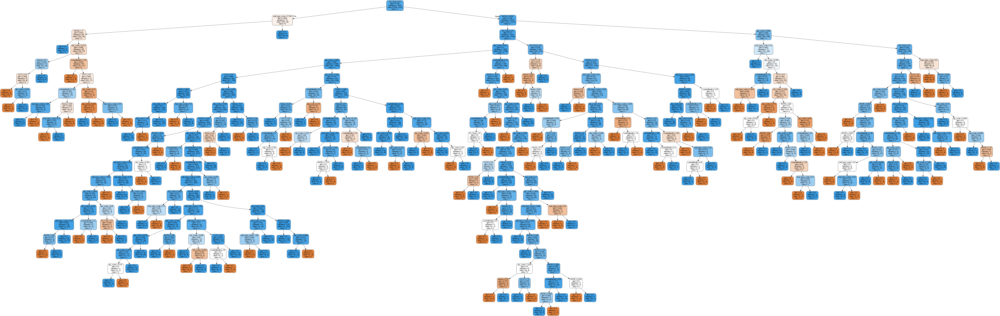

In [147]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image
import pydotplus

col_names = (fit_data.columns)

X = (fit_data.drop(['Loan Amount'],1))
#X = (model_data.drop(['Qualification FICO'],1))
#X = (model_data.drop(['Home'],1))
y = (fit_data['Loan Amount'])

feature_cols = X.columns

fit_data.columns

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('c:/scripts/mwb/mortgage_dt.png')
Image(graph.create_png())

In Scikit-learn, optimization of decision tree classifier performed by only pre-pruning. Maximum depth of the tree can be used as a control variable for pre-pruning. 

We can plot a decision tree on the same data with max_depth=3. Other than pre-pruning parameters, We can also try other attribute selection measure such as entropy.

Accuracy: 0.9041278295605859


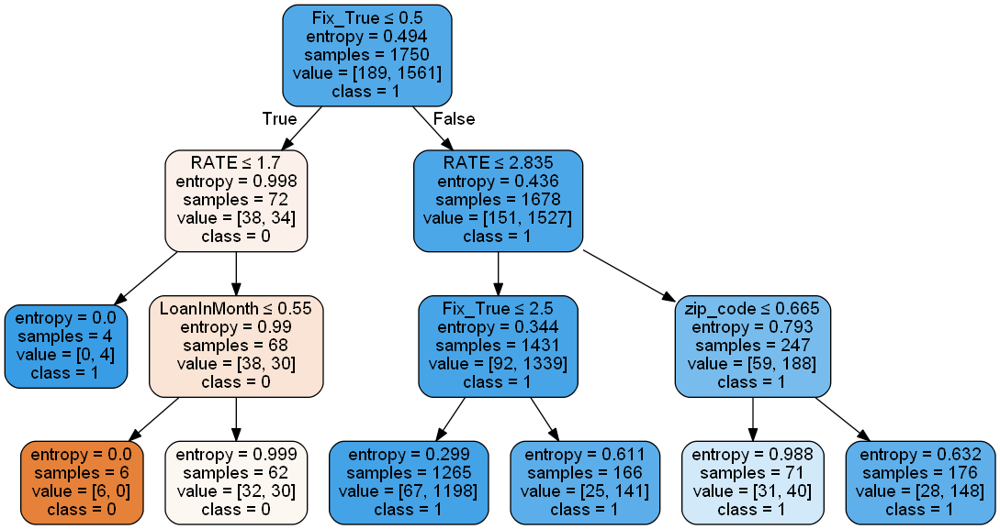

In [153]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy", max_depth=3)

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

#Visualizing Decision Trees
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1','2'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('c:/scripts/mwb/mortgage_dt.png')
Image(graph.create_png())

plotted a decision tree on the same data with max_depth=3. Easy to visualize..

Decision tree model accuracy has also improved.